## Mandandatory exercises.



### *Question 1*:

With this dataset we can define two image registration problems: T1 to T1 registration (e.g. register `3_2_t1_d.tif` to `3_2_t1.tif`) and T2 to T1 registration (e.g. register `3_2_t2.tif` to `3_2_t1.tif`). Which one of these can be considered inter-modal image registration and which one intra-modal image registration?

inter model is T1 and T2 since these 2 are different modalities in MRI imaging. T1 to T1 is intra modal image registration because the image is acquired by the same method.

In [2]:
import sys
sys.path.append("../code")
import registration
import registration_project
import registration_tests
import registration_util as util
import cv2
import matplotlib.pyplot as plt

### Task 1
Test the functionality of cpselect by running the following code example:

In [ ]:
import sys
sys.path.append("../code")
import registration_util as util

I_path = '../data/image_data/1_1_t1.tif'
Im_path = '../data/image_data/1_1_t1_d.tif'

X, Xm = util.cpselect(I_path, Im_path)

print('X:\n{}'.format(X))
print('Xm:\n{}'.format(Xm))

From the provided dataset for this project, select one pair of T1 image slices (e.g. 3_2_t1.tif and 3_2_t1_d.tif) and use my_cpselect to select a set of corresponding points. Then, compute the affine transformation between the pair of images with ls_affine and apply it to the moving image using image_transform.

Repeat the same for a pair of corresponding T1 and T2 slices (e.g. 3_2_t1.tif and 3_2_t2.tif).

In [ ]:


I_path = '../data/image_data/3_3_t1.tif'
Im_path = '../data/image_data/3_3_t1_d.tif'

X_t1_t1, Xm_t1_t1 = util.cpselect(I_path, Im_path)

print('X:\n{}'.format(X_t1_t1))
print('Xm:\n{}'.format(Xm_t1_t1))

I_path = '../data/image_data/3_3_t1.tif'
Im_path = '../data/image_data/3_3_t2.tif'

X_t1_t2, Xm_t1_t2 = util.cpselect(I_path, Im_path)

print('X:\n{}'.format(X_t1_t2))
print('Xm:\n{}'.format(Xm_t1_t2))



In [ ]:
Xh_t1_t1 = util.c2h(X_t1_t1)
Xhm_t1_t1 = util.c2h(Xm_t1_t1)
Xh_t1_t2 = util.c2h(X_t1_t2)
Xhm_t1_t2 = util.c2h(Xm_t1_t2)
    
T_t1_t1 = registration.ls_affine(Xh_t1_t1, Xhm_t1_t1)
T_t1_t2 = registration.ls_affine(Xh_t1_t2, Xhm_t1_t2)

I_path = '../data/image_data/3_3_t1.tif'
Im_path = '../data/image_data/3_3_t1_d.tif'
Im = plt.imread(Im_path)
I = plt.imread(I_path)

it_1 , xt_1= registration.image_transform(Im, T_t1_t1)

fig = plt.figure(figsize=(12,5))

ax1 = fig.add_subplot(131)
im11 = ax1.imshow(I)

ax2 = fig.add_subplot(132)
im21 = ax2.imshow(Im)

ax3 = fig.add_subplot(133)
im31 = ax3.imshow(it_1)

I_path = '../data/image_data/3_3_t1.tif'
Im_path = '../data/image_data/3_3_t2.tif'
Im = plt.imread(Im_path)
I = plt.imread(I_path)

it_2, xt_2 = registration.image_transform(Im, T_t1_t2)

fig = plt.figure(figsize=(12,5))

ax1 = fig.add_subplot(131)
im11 = ax1.imshow(I)

ax2 = fig.add_subplot(132)
im21 = ax2.imshow(Im)

ax3 = fig.add_subplot(133)
im31 = ax3.imshow(it_2)



### *Question 2*:
Describe how you would estimate the registration error. (Hint: Should you use the same points that you used for computing the affine transformation to also compute the registration error?) How does the number of corresponding point pairs affect the registration error? Motivate all your answers.

I would estimate the registration error by first computing the registration, putting the fiducial points on important regions that have good overlap between the 2 images. Then, once the optimization of the registration is done, we can look at the registration error. Compute the target registration error as the average distance between the points in the fixed image and the transformed moving points that are not the points initially chosen in the image. Then, for the number of point pairs chosen. Using a larger number of corresponding point pairs provides a more comprehensive assessment of the registration error. It can provide a more accurate estimate of the model's performance across multiple parts of the images. Using a small number of points may lead to a noisier estimate of the registration error. The error estimate may be sensitive to outliers.

### *Task 2*:

By changing the similarity function and the initial parameter vector, you can also use this script to perform affine registration and use mutual information as a similarity measure. Do not forget to also change the transformation for the visualization of the results.

Using the provided dataset and the functions that you have implemented in the exercises, perform the following series of experiments:

1. Rigid intensity-based registration of two T1 slices (e.g. `1_1_t1.tif` and `1_1_t1_d.tif`) using normalized cross-correlation as a similarity measure.
2. Affine intensity-based registration of two T1 slices (e.g. `1_1_t1.tif` and `1_1_t1_d.tif`) using normalized cross-correlation as a similarity measure.
3. Affine intensity-based registration of a T1 and a T2 slice (e.g. `1_1_t1.tif` and `1_1_t2.tif`) using normalized cross-correlation as a similarity measure.
4. Affine intensity-based registration of two T1 slices (e.g. `1_1_t1.tif` and `1_1_t1_d.tif`) using mutual information as a similarity measure.
5. Affine intensity-based registration of a T1 slice and a T2 slice (e.g. `1_1_t1.tif` and `1_1_t2.tif`) using mutual information as a similarity measure.

Describe, analyze and compare the results from each experiment. If a method fails, describe why you think it fails. Note that you will most likely have to try different values for the learning rate in each experiment in order to find the one that works best. 

In [7]:
%matplotlib inline
import sys
sys.path.append("../code")
from registration_project import intensity_based_registration
import matplotlib.pyplot as plt 


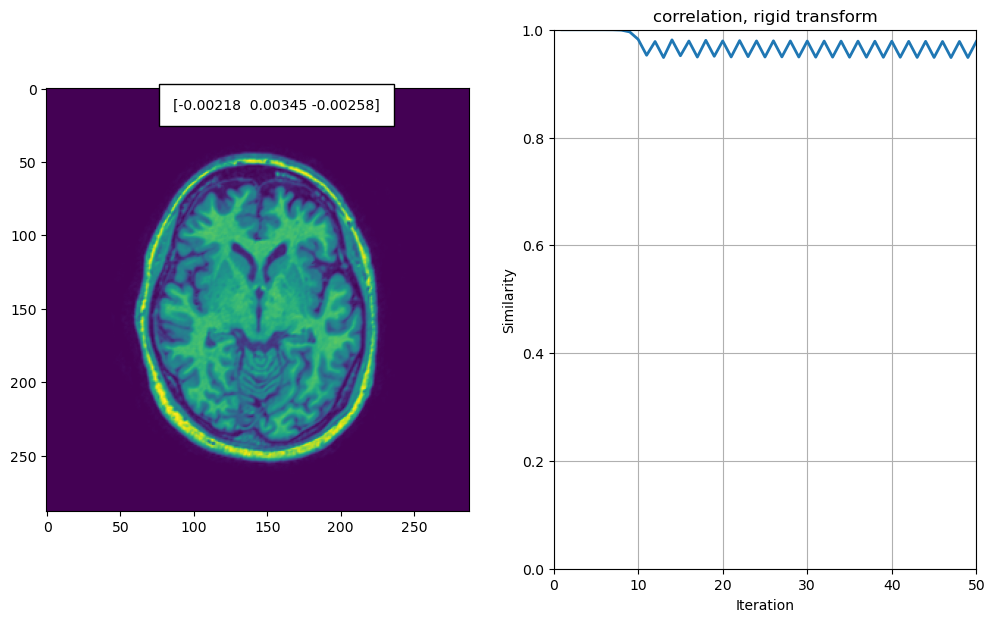

In [8]:
I = plt.imread('../data/image_data/1_1_t1.tif')
Im = plt.imread('../data/image_data/1_1_t1_d.tif')
im_output_rigid_ncc_1 = intensity_based_registration(I, Im, adaptive_learning = False, ncc = True, rigid = True)

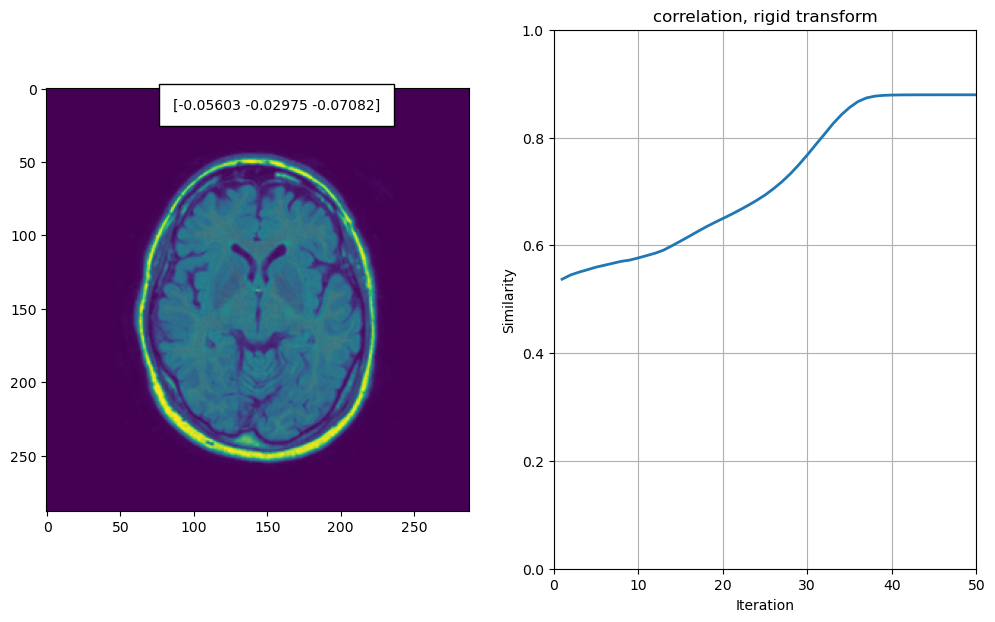

In [9]:
I = plt.imread('../data/image_data/1_1_t1.tif')
Im = plt.imread('../data/image_data/1_1_t2.tif')
im_output_rigid_ncc_2 = intensity_based_registration(I, Im, adaptive_learning = False, ncc = True, rigid = True)

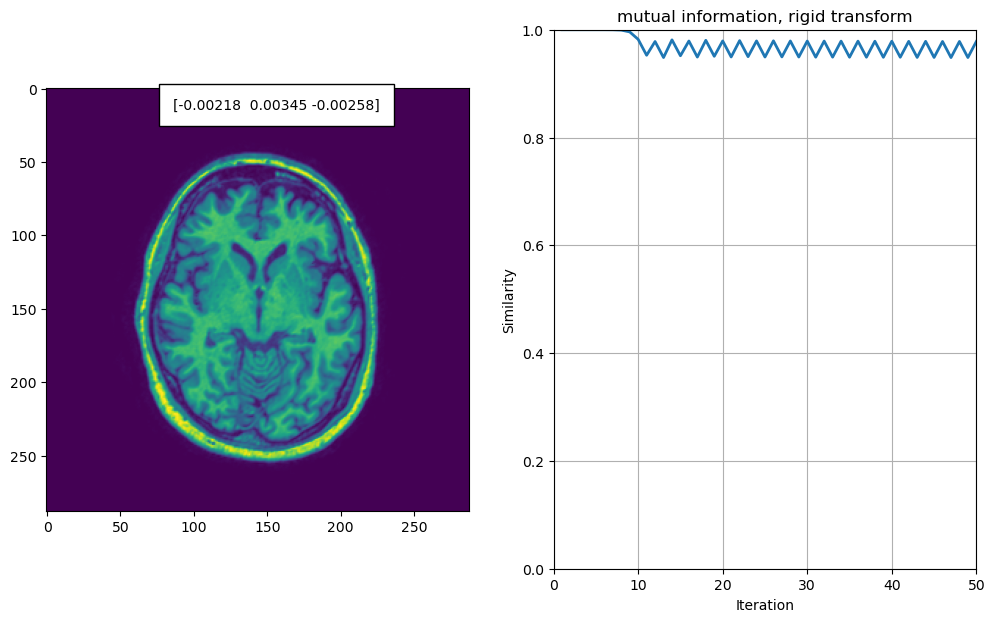

In [10]:
I = plt.imread('../data/image_data/1_1_t1.tif')
Im = plt.imread('../data/image_data/1_1_t1_d.tif')
im_output_rigid_MI_1 = intensity_based_registration(I, Im, adaptive_learning = False, ncc = False, rigid = True)


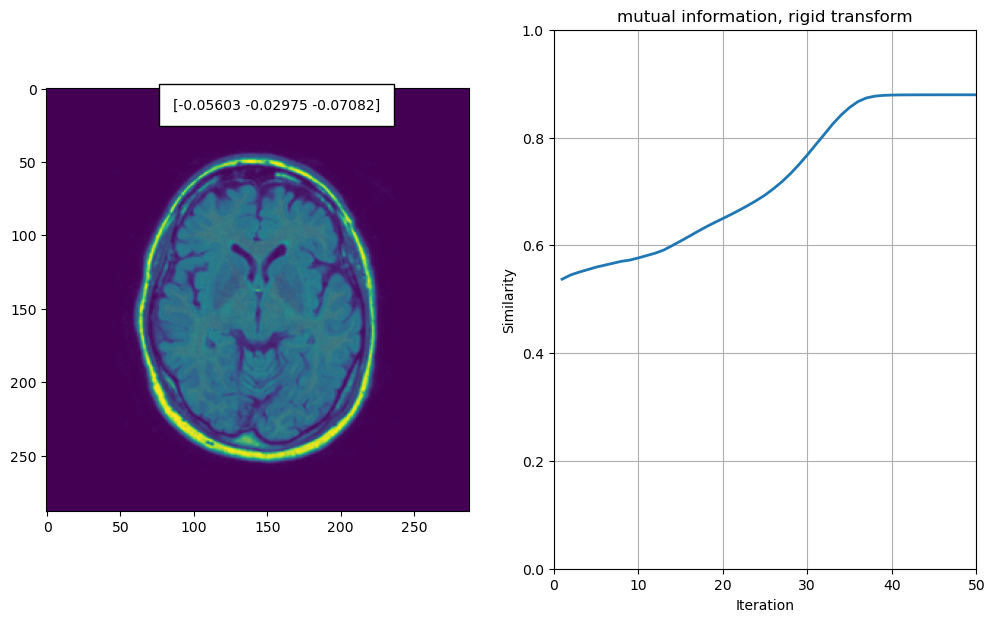

In [11]:
I = plt.imread('../data/image_data/1_1_t1.tif')
Im = plt.imread('../data/image_data/1_1_t2.tif')
im_output_rigid_MI_2 = intensity_based_registration(I, Im, adaptive_learning = False, ncc = False, rigid = True)

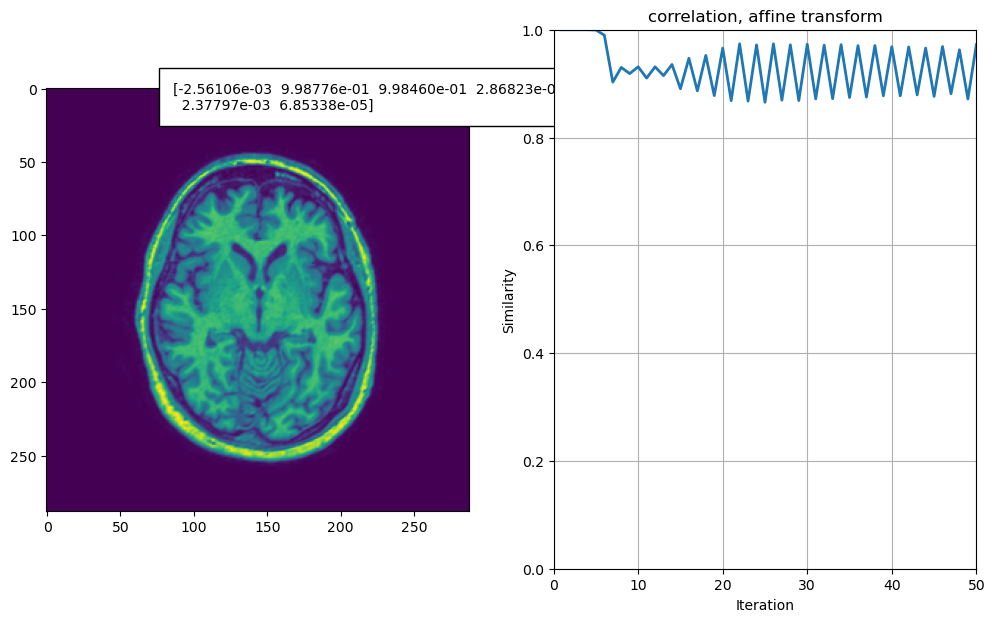

In [12]:
I = plt.imread('../data/image_data/1_1_t1.tif')
Im = plt.imread('../data/image_data/1_1_t1_d.tif')
im_output_affine_ncc_1 = intensity_based_registration(I, Im, adaptive_learning = False, ncc = True, rigid = False)

KeyboardInterrupt: 

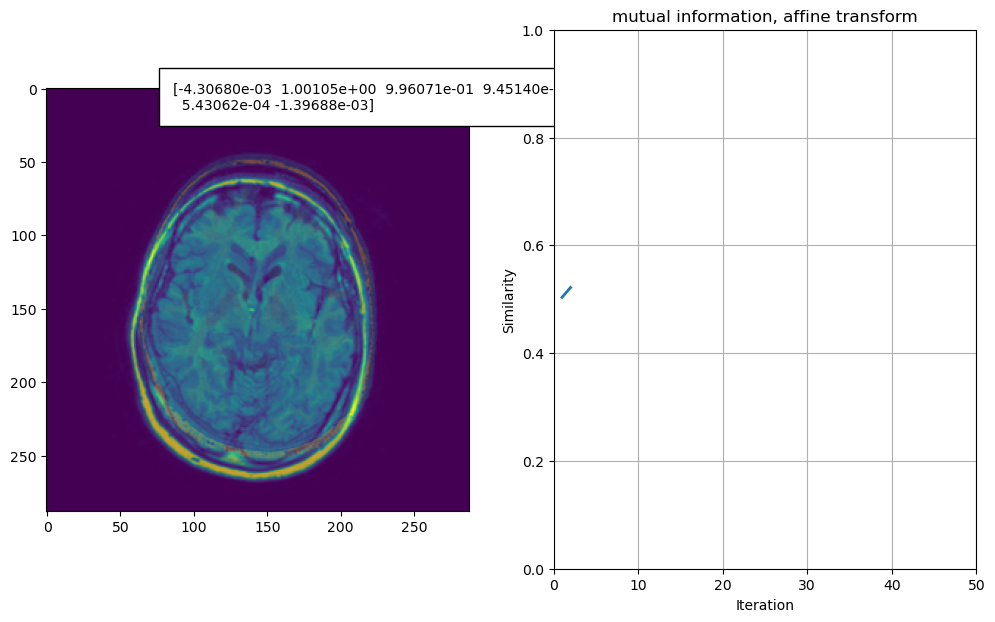

In [13]:
I = plt.imread('../data/image_data/1_1_t1.tif')
Im = plt.imread('../data/image_data/1_1_t2.tif')
im_output_affine_MI_2 = intensity_based_registration(I, Im, adaptive_learning = False, ncc = False, rigid = False)

In [ ]:
I = plt.imread('../data/image_data/1_1_t1.tif')
Im = plt.imread('../data/image_data/1_1_t1_d.tif')
im_output_affine_MI_1 = intensity_based_registration(I, Im, adaptive_learning = False, ncc = False, rigid = False)

In [ ]:
I = plt.imread('../data/image_data/1_1_t1.tif')
Im = plt.imread('../data/image_data/1_1_t2.tif')
im_output_affine_MI_2 =  intensity_based_registration(I, Im, adaptive_learning = False, ncc = False, rigid = False)

## Comparing point-based registration with intensity based registration using correlation.

In this part of the notebook we compute the Target Registration Error (TRE) for both the intensity based registration and point based registration and see which of the two computes the best registration. For this we use the dataset that contains T1, T1_d and T2 images of the brain. We will compare T1 with T1_d and T1 with T2 images for better generalization. From each of these combinations 4 image comparisons will be used. Throughout the notebook the code will be explained.


First we import all modules we need to compute the TRE for the registration methods. This includes the files we had to program throughout the first part of the course such as _registration_util.py_ , _registration_project.py_ and _registration.py_

In [1]:
from os import listdir
import sys
import numpy as np
import os
import sys
sys.path.append("../code")
import registration
import math
from registration_project import intensity_based_registration
import matplotlib.pyplot as plt 
import registration_util as util
from scipy import stats



Now, we take the data that we want. As mentioned before, this consists of 4 images of each of the data types (T1, T1_d and T2). The paths to these images are saved in their own arrays _t1_, _t2_ and _t1_d_.

In [2]:
images = listdir('../data/image_data')

t1 = []
t2= []
t1_d = []

path = '../data/image_data/'
for image in images:
    
    if 't1_d' in os.path.basename(image):
        t1_d.append(path+image)
    elif   't1' in os.path.basename(image):
        t1.append(path+image)
    else:
        t2.append(path+image)


t1 = t1[:4]
t1_d = t1_d[:4]
t2 = t2[:4]

print(t1)
print(t1_d)
print(t2)

['../data/image_data/1_1_t1.tif', '../data/image_data/1_2_t1.tif', '../data/image_data/1_3_t1.tif', '../data/image_data/2_1_t1.tif']
['../data/image_data/1_1_t1_d.tif', '../data/image_data/1_2_t1_d.tif', '../data/image_data/1_3_t1_d.tif', '../data/image_data/2_1_t1_d.tif']
['../data/image_data/1_1_t2.tif', '../data/image_data/1_2_t2.tif', '../data/image_data/1_3_t2.tif', '../data/image_data/2_1_t2.tif']


## Point based registration

Now We start computing the point based registration. Here, we first take the fudicial points to be the inner structure that resembles a butterfly. There will be 4 points selected for registration with each of the points in the most outer point of the 'wings' of the butterfly. The array _points_t1_t1_d_ will contain all the points for the registration between t1 and t1_d, so the fixed points in t1 and the moving points in t1_d. What is also added is the image path of the image t1 and t1_d that will later be used to visualize the images. The array _points_t1_t2_ will contain all the points for the registration between t1 and t2, also the moving and fixed image and the paths for the image visualization. These points are selected through the _cpselect_ tool that was provided in the course material. All fixed and moving points are printed.

In [4]:

points_t1_t1_d = []
for image_t1, image_t1_d in zip(t1, t1_d):
        
    X_t1_t1, Xm_t1_t1 = util.cpselect(image_t1, image_t1_d)

    print('X:\n{}'.format(X_t1_t1))
    print('Xm:\n{}'.format(Xm_t1_t1))
    
    points_t1_t1_d.append([X_t1_t1, Xm_t1_t1, image_t1, image_t1_d])

points_t1_t2 = []
for image_t1, image_t2 in zip(t1, t2):

    X_t1_t2, Xm_t1_t2 = util.cpselect(image_t1, image_t2)

    print('X:\n{}'.format(X_t1_t2))
    print('Xm:\n{}'.format(Xm_t1_t2))
    
    points_t1_t2.append([X_t1_t2, Xm_t1_t2, image_t1, image_t2])



X:
[[124.68709677 161.73225806 109.35806452 177.06129032]
 [107.22129032 107.22129032 169.81483871 168.53741935]]
Xm:
[[126.54516129 161.03548387 111.21612903 182.7516129 ]
 [103.38903226 103.38903226 171.09225806 168.53741935]]
X:
[[125.96451613 159.17741935 115.74516129 171.9516129 ]
 [117.44064516 114.88580645 177.47935484 197.91806452]]
Xm:
[[131.65483871 166.14516129 121.43548387 178.91935484]
 [123.82774194 119.99548387 186.42129032 210.69225806]]
X:
[[131.07419355 157.9        124.68709677 163.00967742]
 [113.6083871  118.71806452 204.30516129 208.13741935]]
Xm:
[[144.42903226 168.7        144.42903226 184.02903226]
 [112.33096774 113.6083871  201.75032258 197.91806452]]
X:
[[129.79677419 163.00967742 109.35806452 175.78387097]
 [100.83419355 100.83419355 158.31806452 163.42774194]]
Xm:
[[139.31935484 171.25483871 121.43548387 190.41612903]
 [114.88580645 111.05354839 172.36967742 176.20193548]]
X:
[[127.24193548 161.73225806 109.35806452 180.89354839]
 [103.38903226 107.2212903

Here, the validation points are chosen to check the registration. These points are the front, right, bottom and left of the skull. This code is similar to the code for the fiducial points, only now it will contain the skull points. both _points_t1_t1_d_outer_ and _points_t1_t2_outer_ contain the fixed points, the moving points and the fixed image path and the moving image path.

In [14]:

points_t1_t1_d_outer = []
for image_t1, image_t1_d in zip(t1, t1_d):
        
    X_t1_t1, Xm_t1_t1 = util.cpselect(image_t1, image_t1_d)

    print('X:\n{}'.format(X_t1_t1))
    print('Xm:\n{}'.format(Xm_t1_t1))
    
    points_t1_t1_d_outer.append([X_t1_t1,Xm_t1_t1, image_t1, image_t1_d])

points_t1_t2_outer = []
for image_t1, image_t2 in zip(t1, t2):

    X_t1_t2, Xm_t1_t2 = util.cpselect(image_t1, image_t2)

    print('X:\n{}'.format(X_t1_t2))
    print('Xm:\n{}'.format(Xm_t1_t2))
    
    points_t1_t2_outer.append([X_t1_t2,Xm_t1_t2, image_t1, image_t2])


X:
[[137.46129032 220.49354839 142.57096774  59.53870968]
 [ 49.73741935 146.82129032 243.90516129 151.93096774]]
Xm:
[[141.87419355 222.3516129  139.31935484  62.67419355]
 [ 47.18258065 153.2083871  242.62774194 151.93096774]]
X:
[[136.18387097 206.44193548 141.29354839  71.03548387]
 [ 61.23419355 150.65354839 242.62774194 153.2083871 ]]
Xm:
[[148.26129032 221.07419355 144.42903226  72.89354839]
 [ 68.89870968 169.81483871 251.56967742 160.87290323]]
X:
[[145.12580645 215.38387097 143.8483871   64.6483871 ]
 [ 59.95677419 148.09870968 238.79548387 157.04064516]]
Xm:
[[150.81612903 235.12580645 163.59032258  89.5       ]
 [ 63.78903226 145.54387097 236.24064516 163.42774194]]
X:
[[138.73870968 216.66129032 143.8483871   69.75806452]
 [ 52.29225806 151.93096774 234.96322581 168.53741935]]
Xm:
[[144.42903226 227.46129032 158.48064516  85.66774194]
 [ 58.67935484 167.26       255.40193548 191.53096774]]
X:
[[142.57096774 220.49354839 142.57096774  63.37096774]
 [ 47.18258065 141.7116129

## Computing the transformation matrices in point based registration

This code now computes the transformation matrix and shows the images before and after transformation. We first create 3 arrays _transformed_images_t1_  _transformation_matrices_t1_ and _fixed_images_t1_. Respectively, they will contain the transformed images that will be used to visualize the change of the datapoints, the transformation matrices that are needed to compute the transformation of the fiducial points and the validation points and finally an array that contains all the fixed images, also used for visualization. All the designated items are saved to these arrays.

Entering the loop now, we loop over all the fiducial points and image paths in _points_t1_t1_d_ and call these transformations. We extract the points for the fixed image and moving image by calling _transformation[0]_ and _transformation[1]_ and make these matrices homogeneous. Then, the transformation matrix is computed for these points in the line _T_t1_t1 = registration.ls_affine(Xh, Xhm)_  Moreover, the images paths are read from the transformations array and will be shown in the plot later. The line _it_1,xt_1= registration.image_transform(Im,T_t1_t1)_ computes the transformation of the moving image that has just been read from the path. Finally, all images, the fixed image, moving image and transformed image are plotted. 

These operations are performed for both the combination _T1_ and _T1_d_, and _T1_ and _T2_.

[[ 0.96913504 -0.04608869  8.60575141]]
[[ 9.73547430e-01  1.01038274e-03 -2.53524698e+00]]
[[ 0.99958721 -0.09491183 -1.31842905]]
[[ 0.97839418 -0.07394795  2.8636278 ]]
[[ 1.05309619e+00 -6.35912481e-04 -3.49314139e+00]]
[[  1.04573217   0.02841941 -14.99539029]]
[[ 1.20357306e+00  1.18801022e-02 -4.32814091e+01]]
[[0.89481777 0.0337761  9.84252786]]


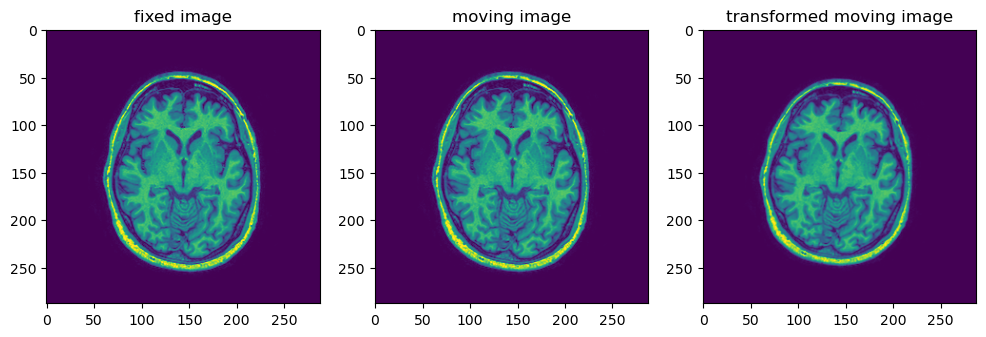

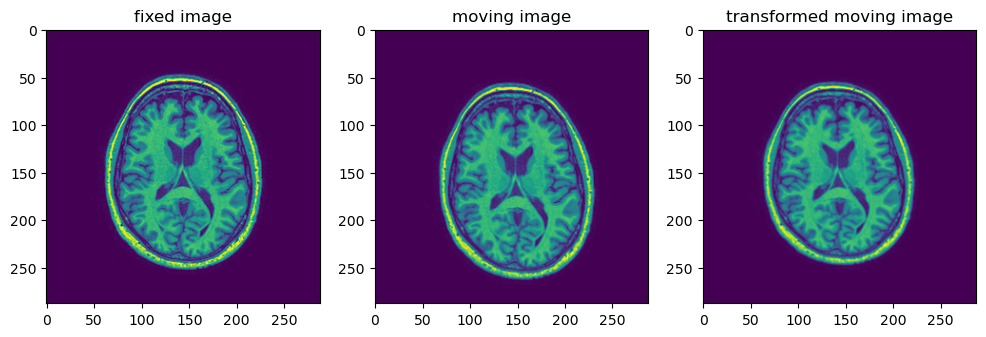

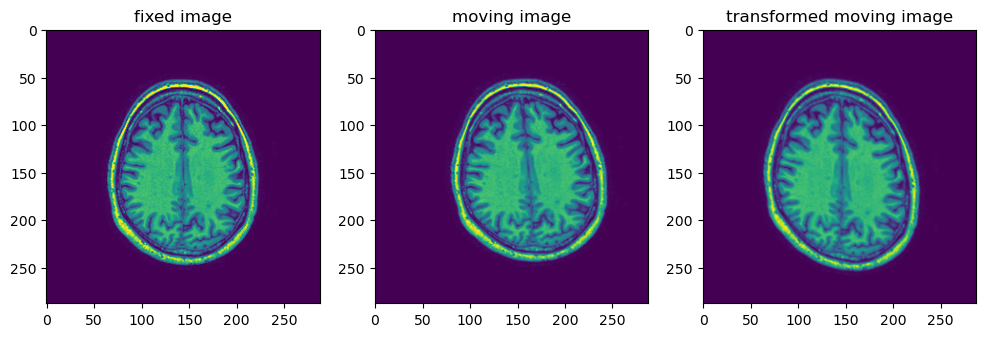

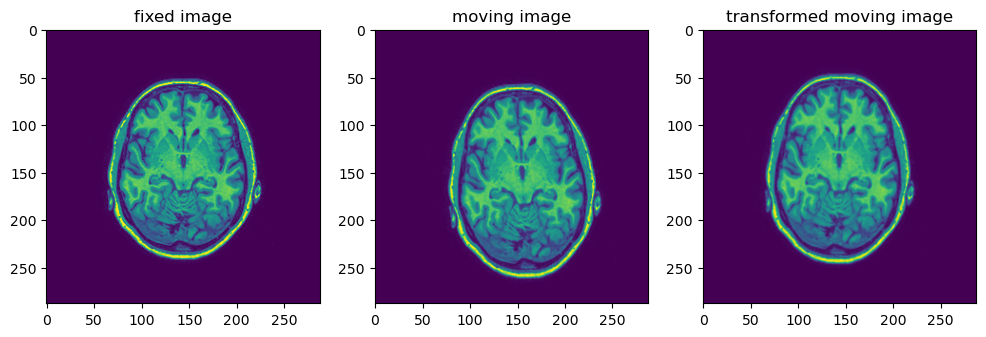

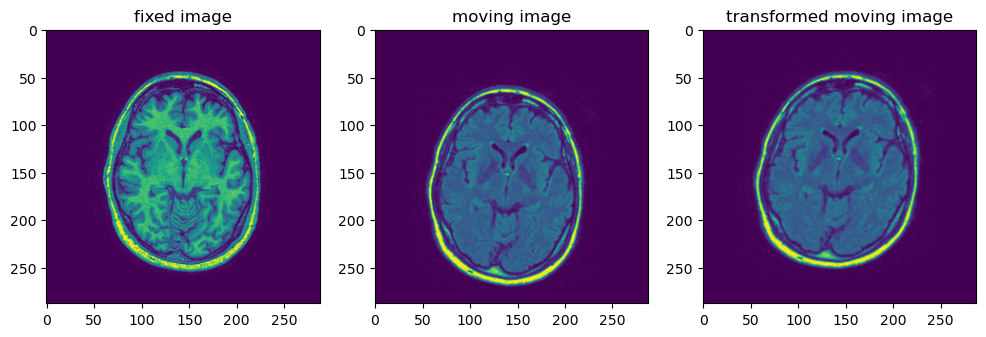

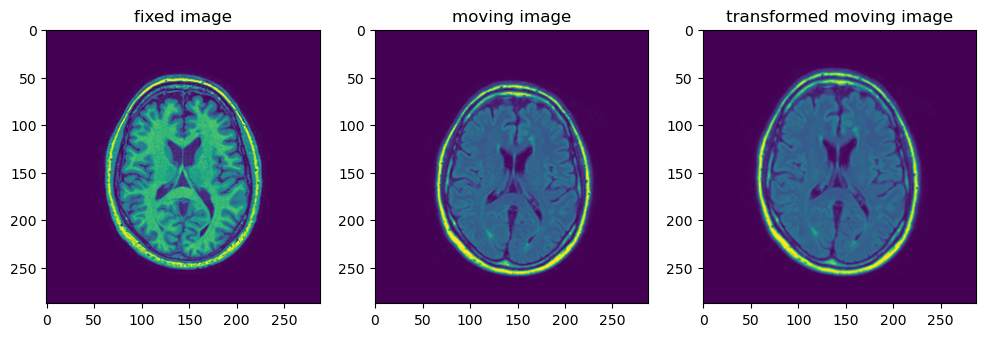

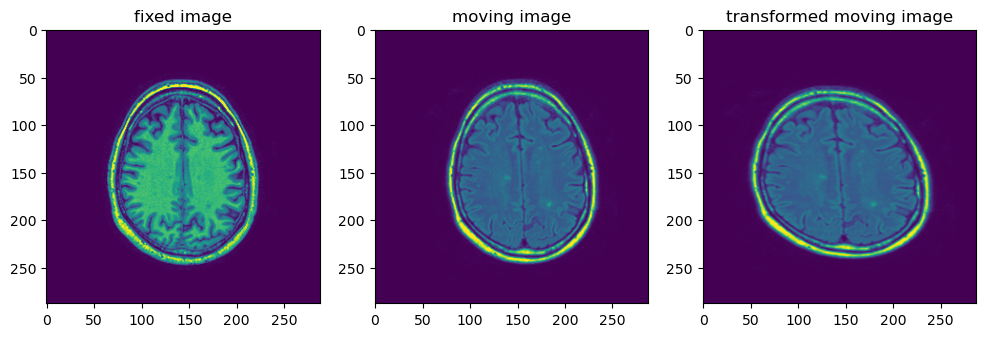

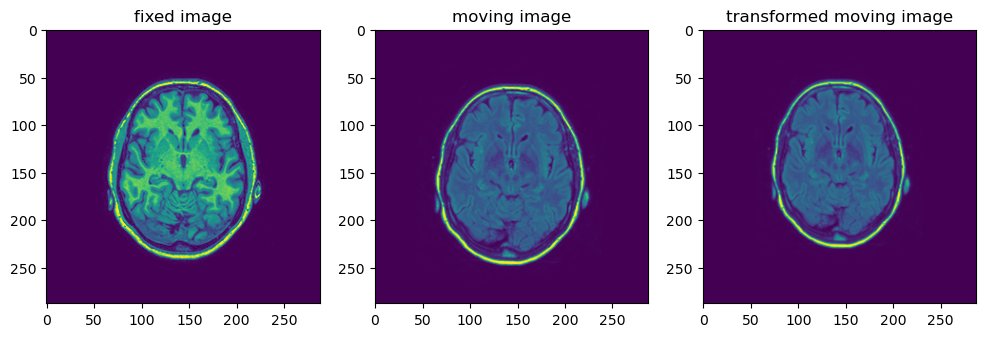

In [15]:
transformed_images_t1 = []
transformation_matrices_t1 = []
fixed_images_t1 = []
for transformations in points_t1_t1_d:
    
    Xh = util.c2h(transformations[0])
    Xhm = util.c2h(transformations[1])

    T_t1_t1 = registration.ls_affine(Xh, Xhm)
    
    Im = plt.imread(transformations[3])
    I = plt.imread(transformations[2])

    it_1 , xt_1= registration.image_transform(Im, T_t1_t1)

    fig = plt.figure(figsize=(12,5))

    ax1 = fig.add_subplot(131)
    im11 = ax1.imshow(I)
    ax1.set_title('fixed image')

    ax2 = fig.add_subplot(132)
    im21 = ax2.imshow(Im)
    ax2.set_title('moving image')

    ax3 = fig.add_subplot(133)
    im31 = ax3.imshow(it_1)
    ax3.set_title('transformed moving image')
    
    transformation_matrices_t1.append(T_t1_t1)
    transformed_images_t1.append(it_1)
    fixed_images_t1.append(I)


transformed_images_t2 = []
transformation_matrices_t2 = []
fixed_images_t2= []
for transformations in points_t1_t2:
    
    Xh = util.c2h(transformations[0])
    Xhm = util.c2h(transformations[1])

    
    T_t1_t2 = registration.ls_affine(Xh, Xhm)
    

    Im = plt.imread(transformations[3])
    I = plt.imread(transformations[2])

    it_1 , xt_1= registration.image_transform(Im, T_t1_t2)

    fig = plt.figure(figsize=(12,5))

    ax1 = fig.add_subplot(131)
    im11 = ax1.imshow(I)
    ax1.set_title('fixed image')

    ax2 = fig.add_subplot(132)
    im21 = ax2.imshow(Im)
    ax2.set_title('moving image')

    ax3 = fig.add_subplot(133)
    im31 = ax3.imshow(it_1)
    ax3.set_title('transformed moving image')

    transformation_matrices_t2.append(T_t1_t2)
    transformed_images_t1.append(it_1)
    fixed_images_t2.append(I)

The code below is the same as the code above, the only thing that is different is that the transformation matrix that was computed for the fiducial points above has been reused here for the validation points. These is now an array _transformed_coordinates_outer_t1_ that stores the transformed validation points. The transformed coordinates are computed in the line _transformed_coordinates = np.dot(transformation_matrix, Xhm)_. This is again computed for both the combinations _T1_ and _T1_d_, and _T1_ and _T2_


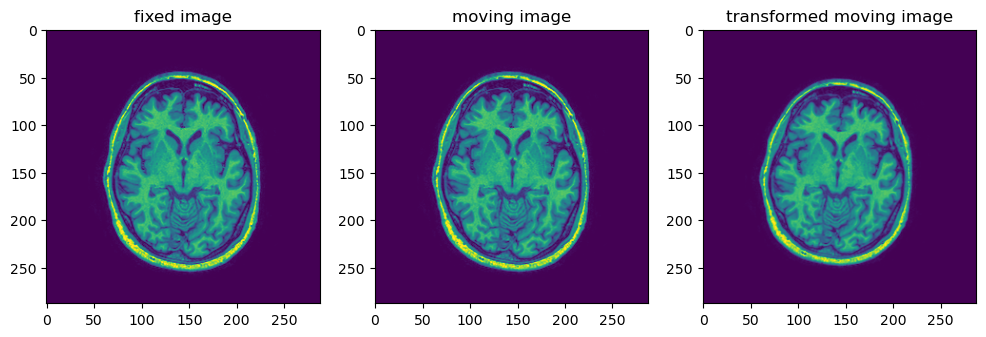

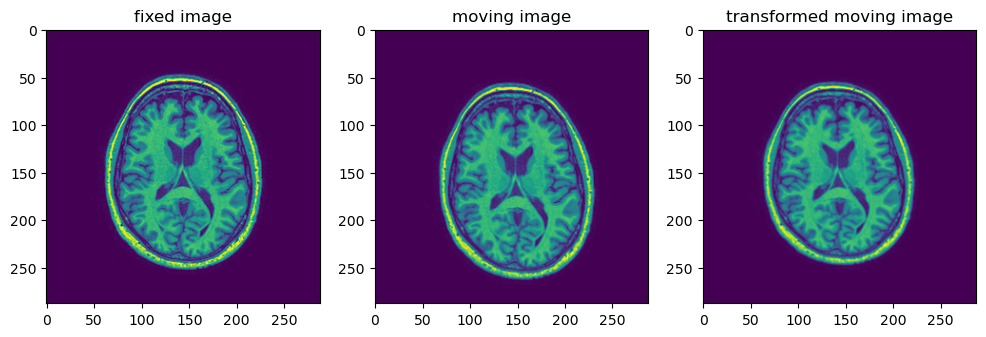

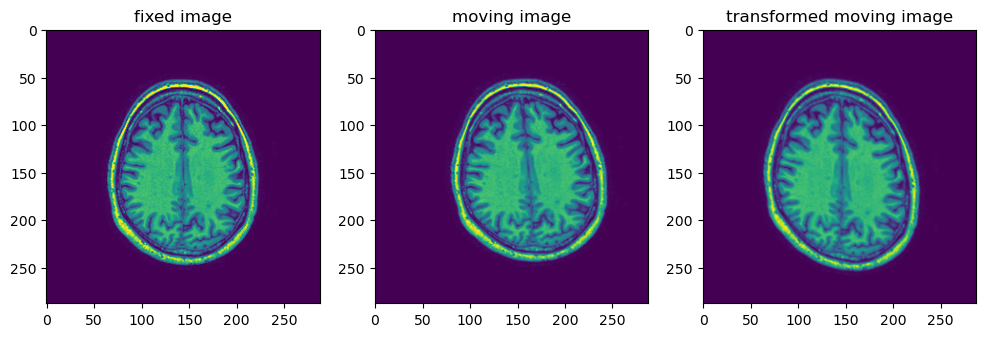

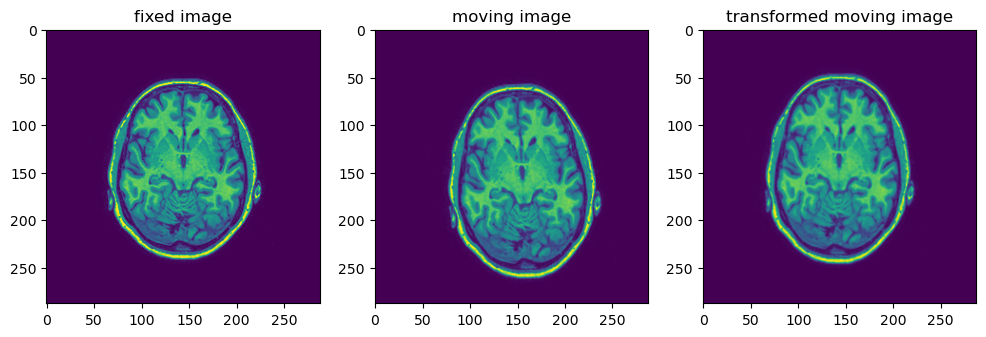

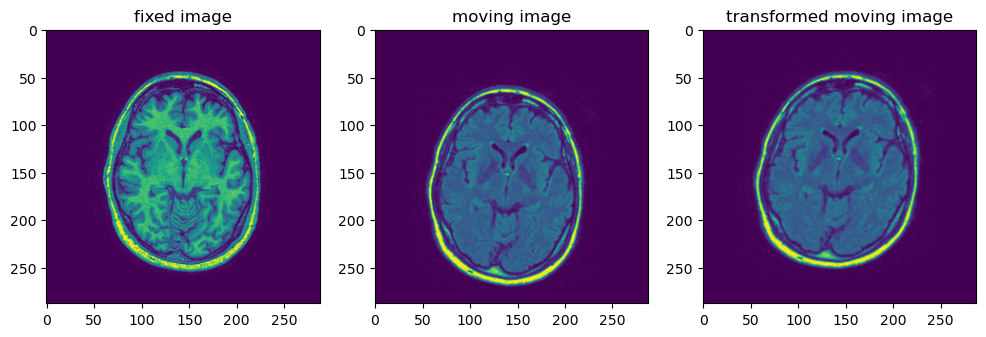

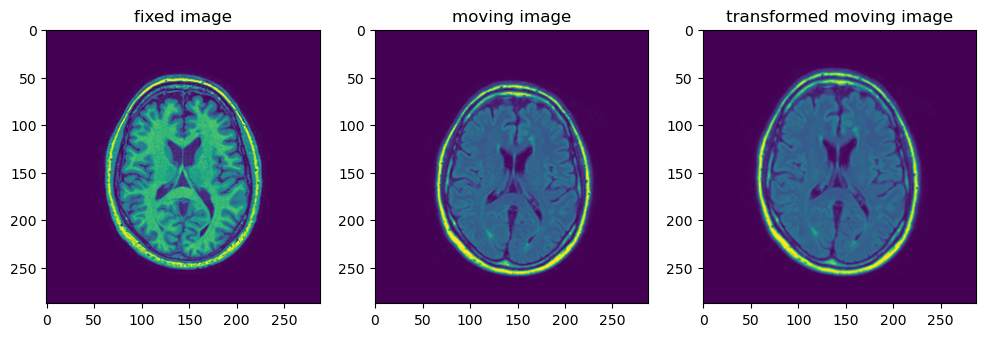

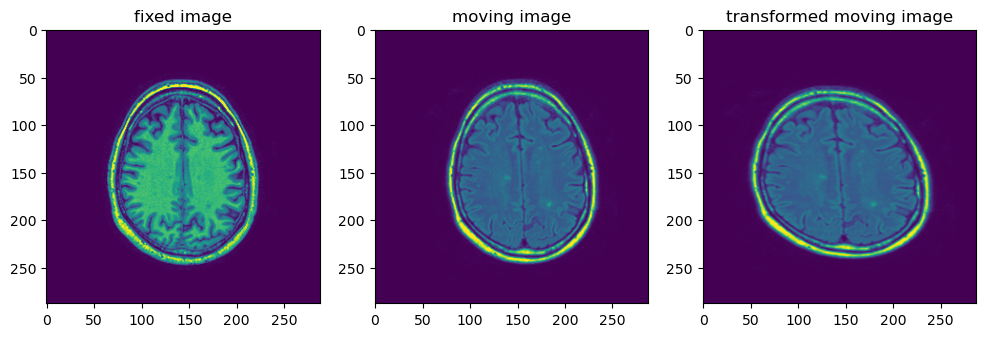

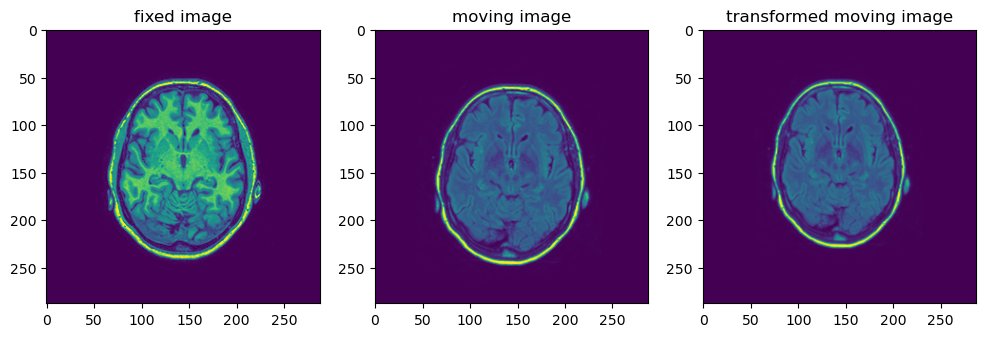

In [16]:
transformed_coordinates_outer_t1 = []
for transformations, transformation_matrix in zip(points_t1_t1_d_outer, transformation_matrices_t1):
    
    Xh = util.c2h(transformations[0])
    Xhm = util.c2h(transformations[1])
    
    T_t1_t1 = transformation_matrix
    
    transformed_coordinates = np.dot(transformation_matrix, Xhm)
        
    Im = plt.imread(transformations[3])
    I = plt.imread(transformations[2])

    it_1 , xt_1= registration.image_transform(Im, T_t1_t1)

    fig = plt.figure(figsize=(12,5))

    ax1 = fig.add_subplot(131)
    im11 = ax1.imshow(I)
    ax1.set_title('fixed image')

    ax2 = fig.add_subplot(132)
    im21 = ax2.imshow(Im)
    ax2.set_title('moving image')

    ax3 = fig.add_subplot(133)
    im31 = ax3.imshow(it_1)
    ax3.set_title('transformed moving image')
    
    transformed_coordinates_outer_t1.append(transformed_coordinates)
    

transformed_coordinates_outer_t2 = []
for transformations, transformation_matrix in zip(points_t1_t2_outer, transformation_matrices_t2):
    
    Xh = util.c2h(transformations[0])
    Xhm = util.c2h(transformations[1])

    
    T_t1_t2 = transformation_matrix
    
    transformed_coordinates = np.dot(transformation_matrix, Xhm)

    Im = plt.imread(transformations[3])
    I = plt.imread(transformations[2])

    it_1 , xt_1= registration.image_transform(Im, T_t1_t2)

    fig = plt.figure(figsize=(12,5))

    ax1 = fig.add_subplot(131)
    im11 = ax1.imshow(I)
    ax1.set_title('fixed image')

    ax2 = fig.add_subplot(132)
    im21 = ax2.imshow(Im)
    ax2.set_title('moving image')

    ax3 = fig.add_subplot(133)
    im31 = ax3.imshow(it_1)
    ax3.set_title('transformed moving image')

    transformed_coordinates_outer_t2.append(transformed_coordinates)

## Computing the TRE in point based registration

Now that we have all the data we need, we can compute the TRE. We start off with an array TRE_t1 that will contain the TRE for the registration of _T1_ and _T1_d_. Additionally, the validation point coordinates  are extracted from the arrays _points_t1_t1_d_outer_. These are stored in _validation_points_outer_t1_. We then loop over the validation points, the transformed validation points and the point data _points_t1_t1_d_outer_. 

In the loop, we start another for loop that loops over all the coordinates and computes the distance between the respective points. This is the TRE of the single image comparisons. Then, we read the images from their paths in the data array and we plot the images and create lines from the validation points to the transformed validation points, such that we can what exactly happened. Finally, the TRE's are stored in TRE_t1.

Below this code block is is a code block that has the same code but computes the TRE for the comparison of _T1_ and _T2_.

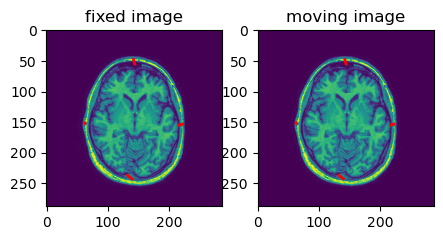

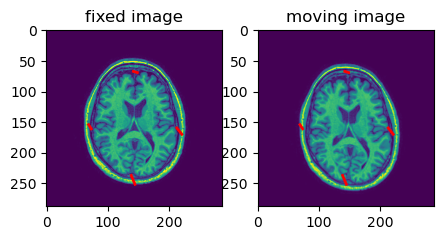

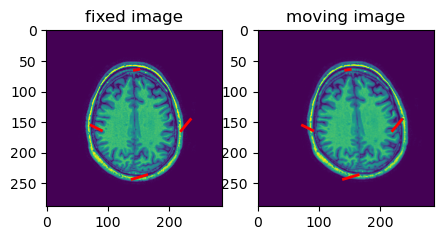

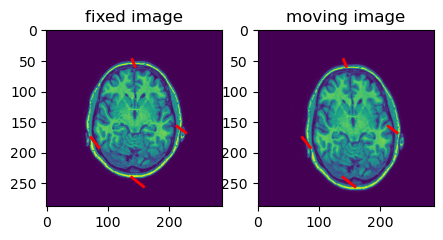

[0.5838663068152941, 8.077275318580648, 18.748377156939352, 21.07732134535761]


In [40]:
TRE_t1 = []
validation_points_outer_t1 = [outer[1] for outer in points_t1_t1_d_outer]
for points_outer, transformed_coordinates, data  in zip(validation_points_outer_t1, transformed_coordinates_outer_t1, points_t1_t1_d_outer):
    
    
    for i in range(points_outer.shape[1]):
        x = points_outer[0][i]
        y = points_outer[1][i]
        
        xt = transformed_coordinates[0][i]
        yt = transformed_coordinates[1][i]
        
        TRE = math.dist((x,y),(xt,yt))
    
    Im = plt.imread(data[3])
    I = plt.imread(data[2])
        
    fig = plt.figure(figsize=(5,5))

    ax1 = fig.add_subplot(121)
    im11 = ax1.imshow(I)
    ax1.set_title('fixed image')
    for i in range(points_outer.shape[1]):
        ax1.plot([points_outer[0][i], transformed_coordinates[0][i]], [points_outer[1][i], transformed_coordinates[1][i]], color='red', linewidth=2)

        
    ax2 = fig.add_subplot(122)
    im21 = ax2.imshow(Im)
    ax2.set_title('moving image')
    for i in range(points_outer.shape[1]):
        ax2.plot([points_outer[0][i], transformed_coordinates[0][i]], [points_outer[1][i], transformed_coordinates[1][i]], color='red', linewidth=2)
    
    plt.show()

    TRE_t1.append(TRE)



    
print(TRE_t1)



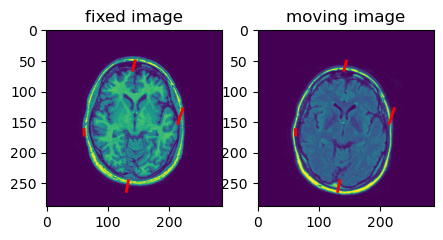

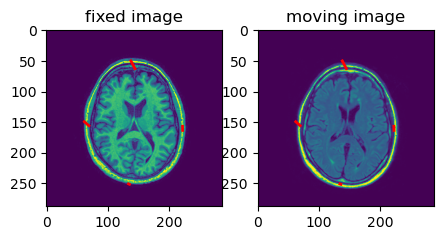

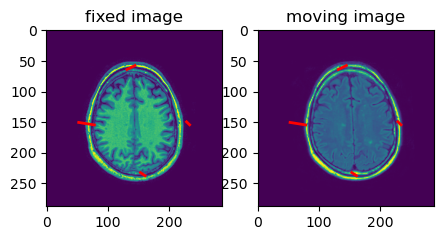

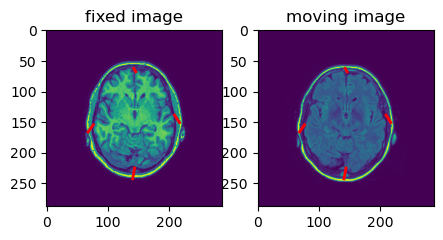

[25.085880476682092, 6.694310965870986, 7.052035398932175, 14.583653736842937]


In [39]:
TRE_t2 = []
validation_points_outer_t2 = [outer[1] for outer in points_t1_t2_outer]
for points_outer, transformed_coordinates, data in zip(validation_points_outer_t2, transformed_coordinates_outer_t2, points_t1_t2_outer):
    
    for i in range(len(points_outer)):
        x = points_outer[0][i]
        y = points_outer[1][i]
        
        xt = transformed_coordinates[0][i]
        yt = transformed_coordinates[1][i]
        
        TRE = math.dist((x,y),(xt,yt))

    
    Im = plt.imread(data[3])
    I = plt.imread(data[2])
    
    fig = plt.figure(figsize=(5,5))

    
    ax3 = fig.add_subplot(121)
    im31 = ax3.imshow(I)
    ax3.set_title('fixed image')
    for i in range(points_outer.shape[1]):
        ax3.plot([points_outer[0][i], transformed_coordinates[0][i]], [points_outer[1][i], transformed_coordinates[1][i]], color='red', linewidth=2)

        
    ax4 = fig.add_subplot(122)
    im41 = ax4.imshow(Im)
    ax4.set_title('moving image')
    for i in range(points_outer.shape[1]):
        ax4.plot([points_outer[0][i], transformed_coordinates[0][i]], [points_outer[1][i], transformed_coordinates[1][i]], color='red', linewidth=2)

    plt.show()
        
        
    TRE_t2.append(TRE)
    
print(TRE_t2)


## Computing the TRE for intensity based registration using correlation.


Now, we will compute the TRE for intensity based registration using correlation as evaluation using the same data as for point based registration at the same validation points. First, we call the function _intensity_based_registration_ that produces a transformation matrix, a similarity and a transformed image. This data will be stored in _outputs_fixed_learning_rate_t1_t1_d_. 

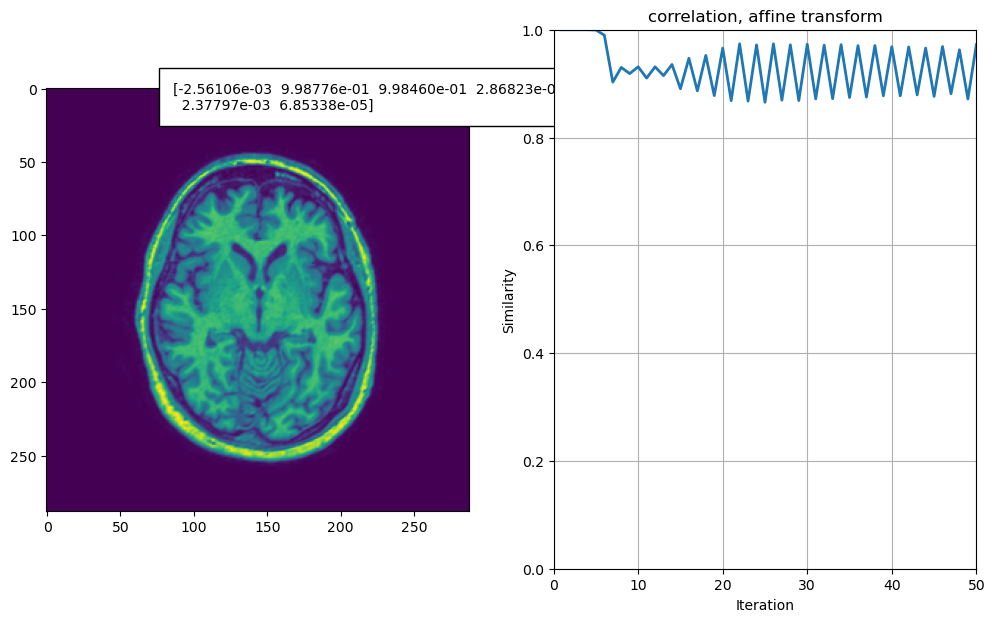

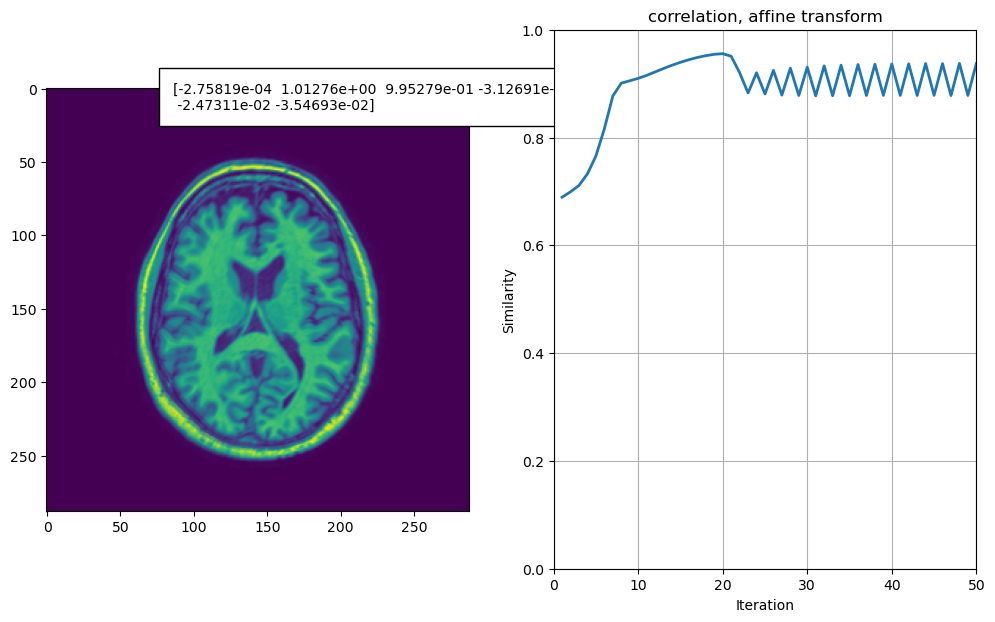

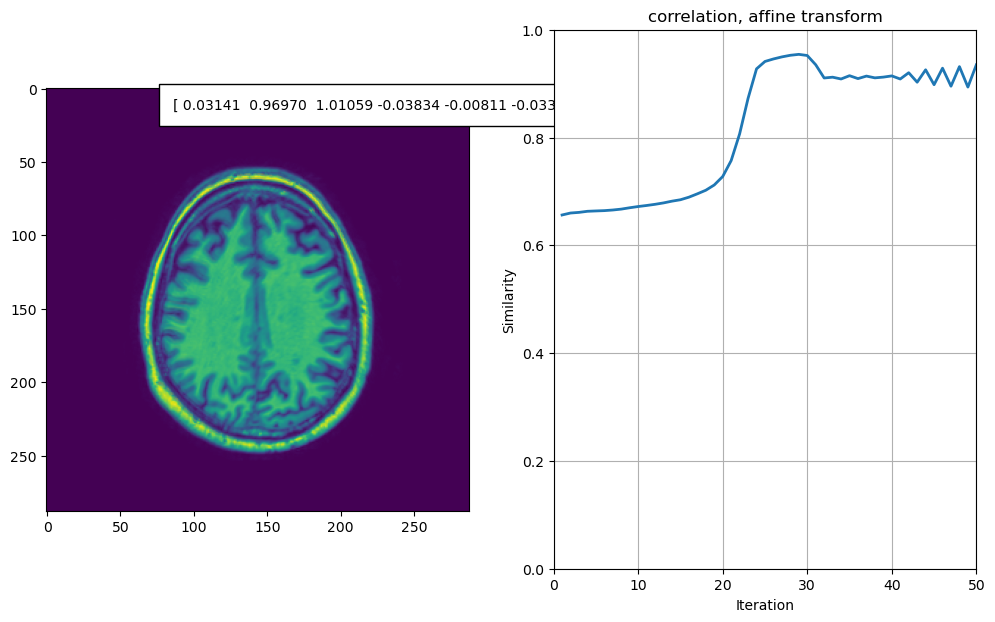

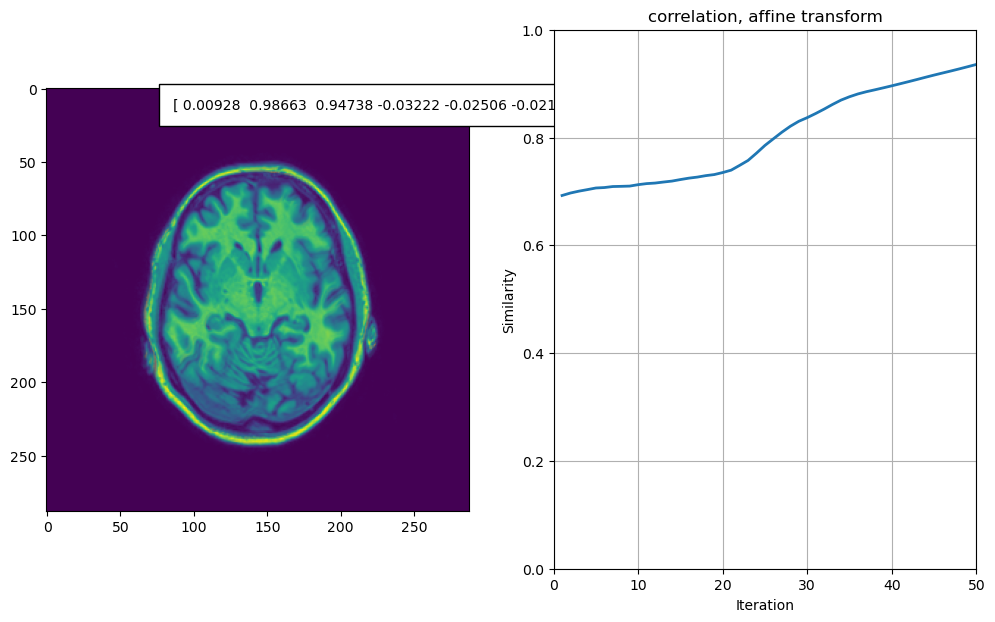

In [41]:
outputs_fixed_learning_rate_t1_t1_d = []
for image_t1, image_t1_d in zip(t1, t1_d):

    print('computing correlation for image:' + image_t1 + ' and ' + image_t1_d)
    I = plt.imread(image_t1)
    Im = plt.imread(image_t1_d)
    t1_t1_d_output_ncc = intensity_based_registration(I, Im, adaptive_learning = False, ncc = True, rigid = False)
    outputs_fixed_learning_rate_t1_t1_d.append(t1_t1_d_output_ncc)


now that we have the data we need, we can compute the TRE. First, we create an array TRE_t1_corr that stores the TRE for the _T1_ and _T1_d_ correlation. We extract the validation points from the _points_t1_t1_d_outer_ array and store it in _validation_points_outer_t1_. Moreover, we loop over the validation points and the outputs from the intensity based registration. We apply the tranformation matrix from intensity based registration on the validation points. Furthermore, we loop over the validation points and compute the TRE by computing the distance between the validation points and the transformated validation points. 

Lastly, the images are plotted and lines are created between the tranformed and normal validation points for visualization.

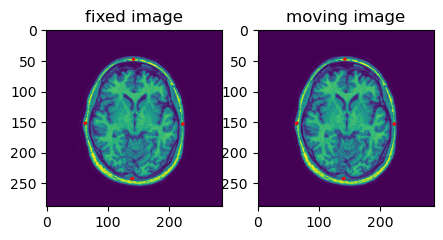

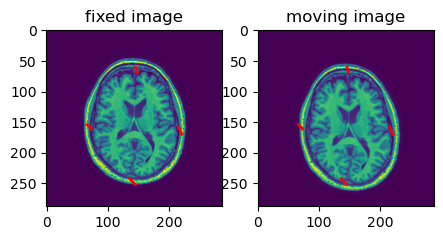

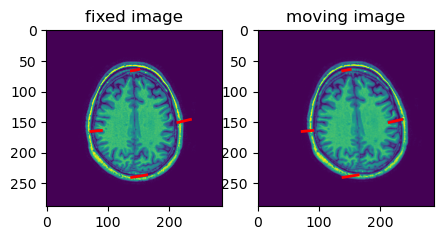

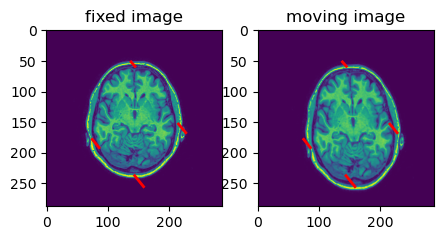

[1.0432625294527502, 9.315400050158615, 17.383159651803396, 17.392523618706253]


In [42]:
TRE_t1_corr = []
validation_points_outer_t1 = [outer[1] for outer in points_t1_t1_d_outer ]
for points_outer, image_output, data in zip(validation_points_outer_t1, outputs_fixed_learning_rate_t1_t1_d, points_t1_t1_d):
    im2, S, Th = image_output

    Xhm = util.c2h(points_outer)
    transformed_coordinates = np.dot(Th, Xhm)


    for i in range(points_outer.shape[1]):
        x = points_outer[0][i]
        y = points_outer[1][i]

        xt = transformed_coordinates[0][i]
        yt = transformed_coordinates[1][i]
        
        TRE = math.dist((x,y),(xt,yt))
    
    Im = plt.imread(data[3])
    I = plt.imread(data[2])
    
    fig = plt.figure(figsize=(5,5))

    
    ax3 = fig.add_subplot(121)
    im31 = ax3.imshow(I)
    ax3.set_title('fixed image')
    for i in range(points_outer.shape[1]):
        ax3.plot([points_outer[0][i], transformed_coordinates[0][i]], [points_outer[1][i], transformed_coordinates[1][i]], color='red', linewidth=2)

        
    ax4 = fig.add_subplot(122)
    im41 = ax4.imshow(Im)
    ax4.set_title('moving image')
    for i in range(points_outer.shape[1]):
        ax4.plot([points_outer[0][i], transformed_coordinates[0][i]], [points_outer[1][i], transformed_coordinates[1][i]], color='red', linewidth=2)

    plt.show()

    TRE_t1_corr.append(TRE)
            
print(TRE_t1_corr)

Now, we will compute the TRE for intensity based registration using correlation as evaluation using the same data as for point based registration at the same validation points. First, we call the function _intensity_based_registration_ that produces a transformation matrix, a similarity and a transformed image. This data will be stored in _outputs_fixed_learning_rate_t1_t2_. 

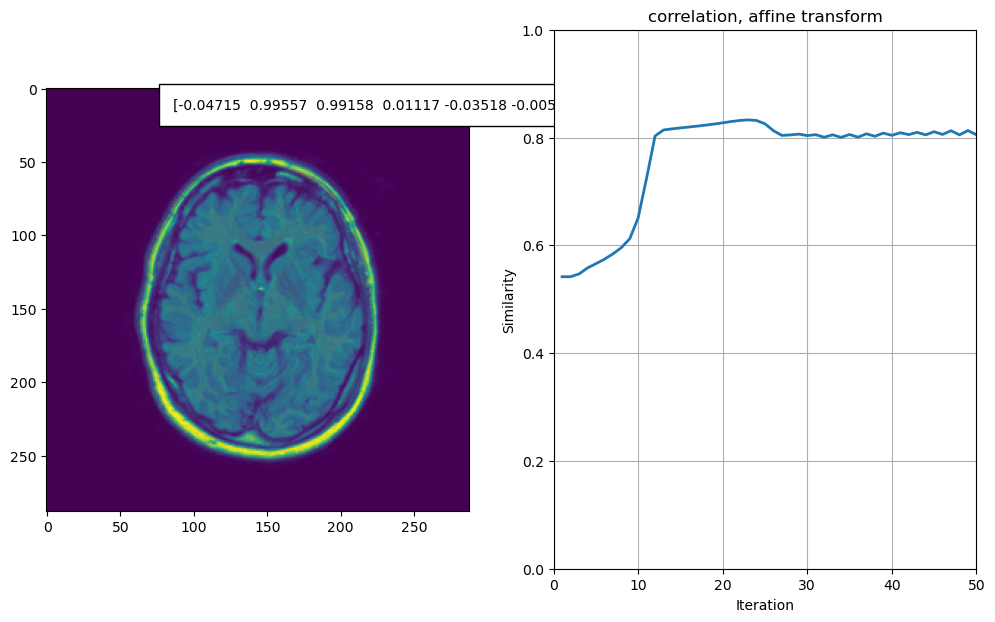

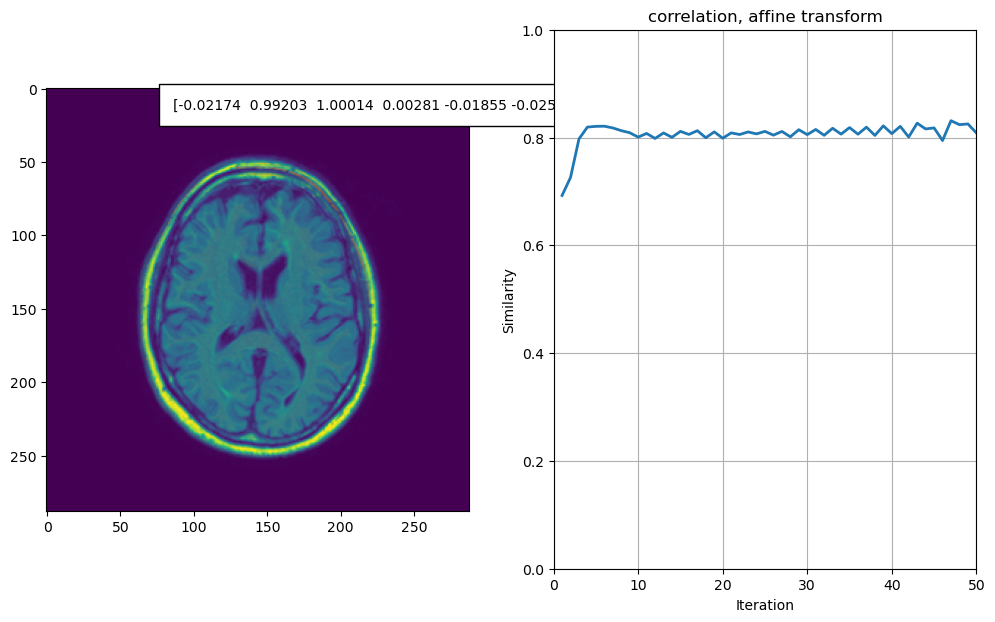

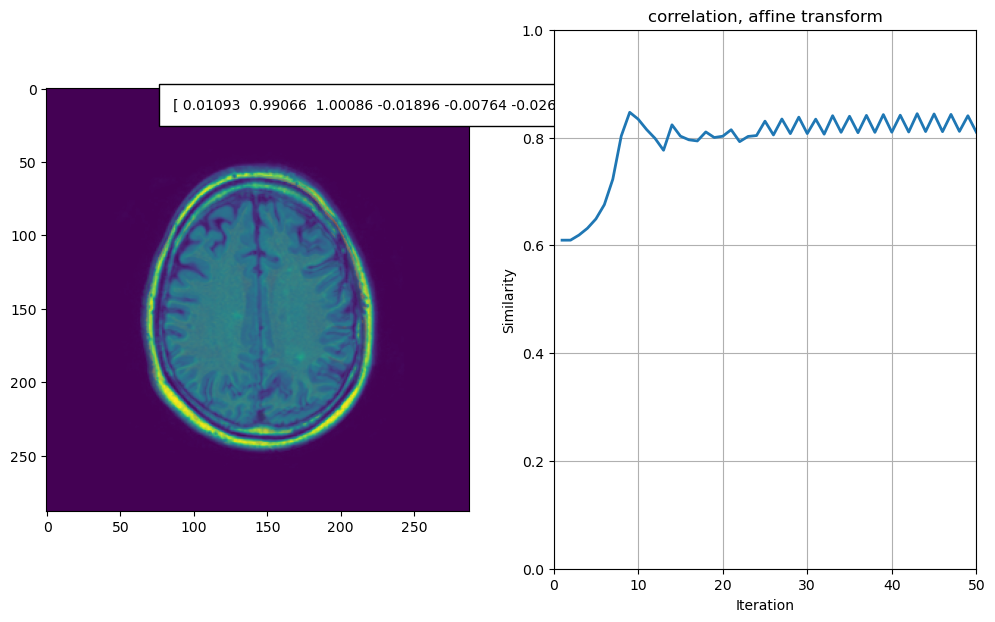

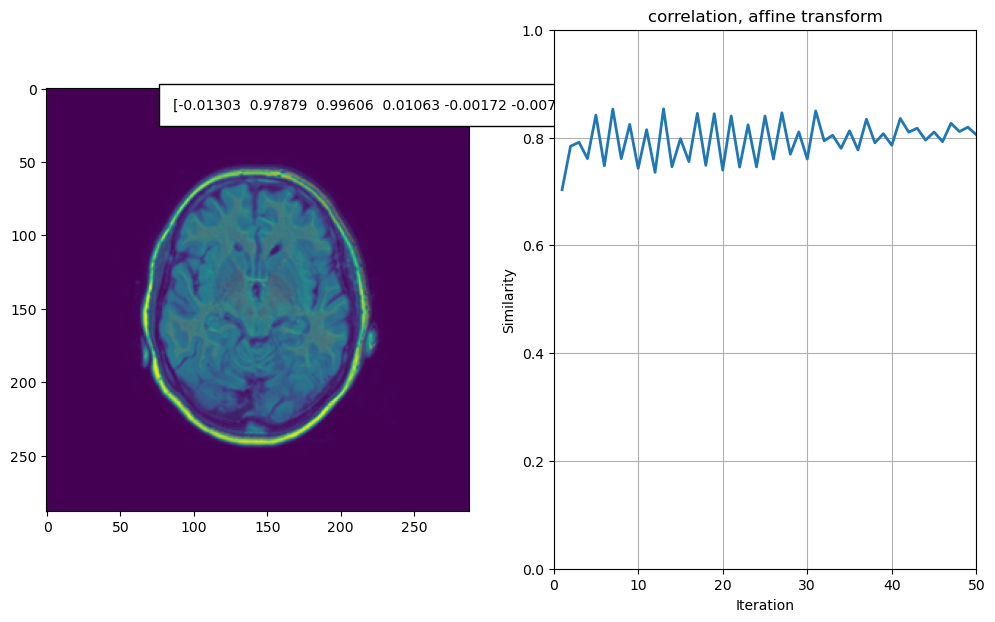

In [43]:
outputs_fixed_learning_rate_t1_t2 = []
for image_t1, image_t2 in zip(t1, t2):

    print('computing correlation for image:' + image_t1 + ' and ' + image_t2)
    I = plt.imread(image_t1)
    Im = plt.imread(image_t2)
    t1_t2_output_ncc = intensity_based_registration(I, Im, adaptive_learning = False, ncc = True, rigid = False)
    outputs_fixed_learning_rate_t1_t2.append(t1_t2_output_ncc)

now that we have the data we need, we can compute the TRE. First, we create an array TRE_t2_corr that stores the TRE for the _T1_ and _T2_ correlation. We extract the validation points from the _points_t1_t2_outer_ array and store it in _validation_points_outer_t2_. Moreover, we loop over the validation points and the outputs from the intensity based registration. We apply the tranformation matrix from intensity based registration on the validation points. Furthermore, we loop over the validation points and compute the TRE by computing the distance between the validation points and the transformated validation points. 

Lastly, the images are plotted and lines are created between the tranformed and normal validation points for visualization.

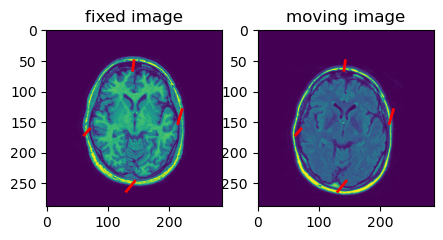

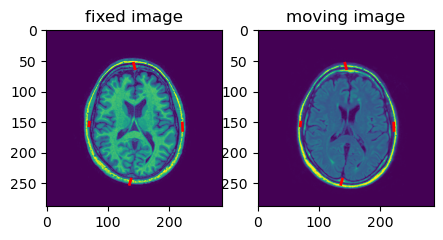

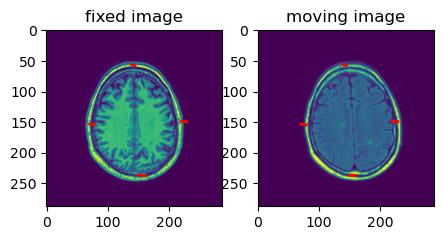

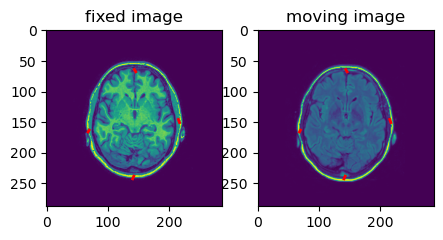

[13.417166469314635, 5.744399025418473, 8.054225150321347, 3.4758375679418902]


In [44]:
TRE_t2_corr = []
validation_points_outer_t2 = [outer[1] for outer in points_t1_t2_outer ]
for points_outer, image_output, data in zip(validation_points_outer_t2, outputs_fixed_learning_rate_t1_t2, points_t1_t2):
    im2, S, Th = image_output

    Xhm = util.c2h(points_outer)
    transformed_coordinates = np.dot(Th, Xhm)


    for i in range(points_outer.shape[1]):
        x = points_outer[0][i]
        y = points_outer[1][i]

        xt = transformed_coordinates[0][i]
        yt = transformed_coordinates[1][i]
        
        TRE = math.dist((x,y),(xt,yt))
    
    Im = plt.imread(data[3])
    I = plt.imread(data[2])
    
    fig = plt.figure(figsize=(5,5))

    
    ax3 = fig.add_subplot(121)
    im31 = ax3.imshow(I)
    ax3.set_title('fixed image')
    for i in range(points_outer.shape[1]):
        ax3.plot([points_outer[0][i], transformed_coordinates[0][i]], [points_outer[1][i], transformed_coordinates[1][i]], color='red', linewidth=2)

        
    ax4 = fig.add_subplot(122)
    im41 = ax4.imshow(Im)
    ax4.set_title('moving image')
    for i in range(points_outer.shape[1]):
        ax4.plot([points_outer[0][i], transformed_coordinates[0][i]], [points_outer[1][i], transformed_coordinates[1][i]], color='red', linewidth=2)

    plt.show()
        
    TRE_t2_corr.append(TRE)
            
print(TRE_t2_corr)

# Adaptive learning rate


In this analysis we will compare the use cases of adaptive learning rate and fixed learning rate. We will see if there is a significant difference between the cases t1 and t2, and for the cases t1 and t1_d. These images will be evaluated using the correlation metric and the images all can undergo affined transformations. 

First, the cases of t1 and t1_d images will be computed with a fixed learning rate. 
second, the cases of t1 and t2 images will be computed with a fixed learning rate. 
third, the cases of t1 and t1_d images will be computed with a adaptive learning rate. 
lastly, the cases of t1 and t2 images will be computed with a adaptive learning rate. 

then, once all outputs have been computed, of the resulting similarity arrays the last element will be taken, the 'optimal' similarity..
These last values will be compared between the corresponding cases (fixed t1 and t1_d with its adaptive form, just like t1 and t2) and subsequently seen if there is a significant difference between them

### Correlation fixed learning rate of  t1 t1_d images (affine)

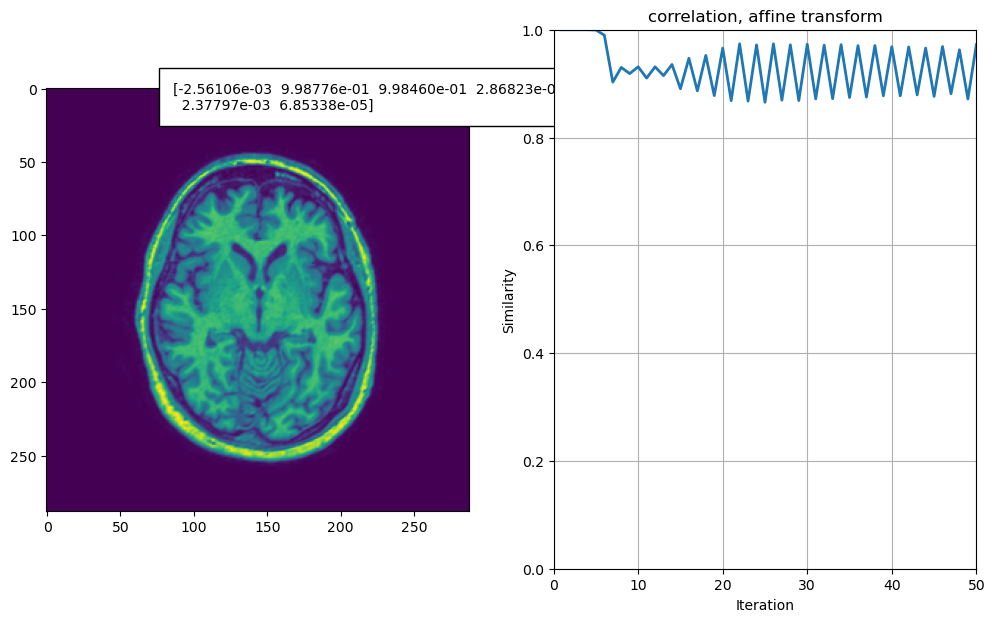

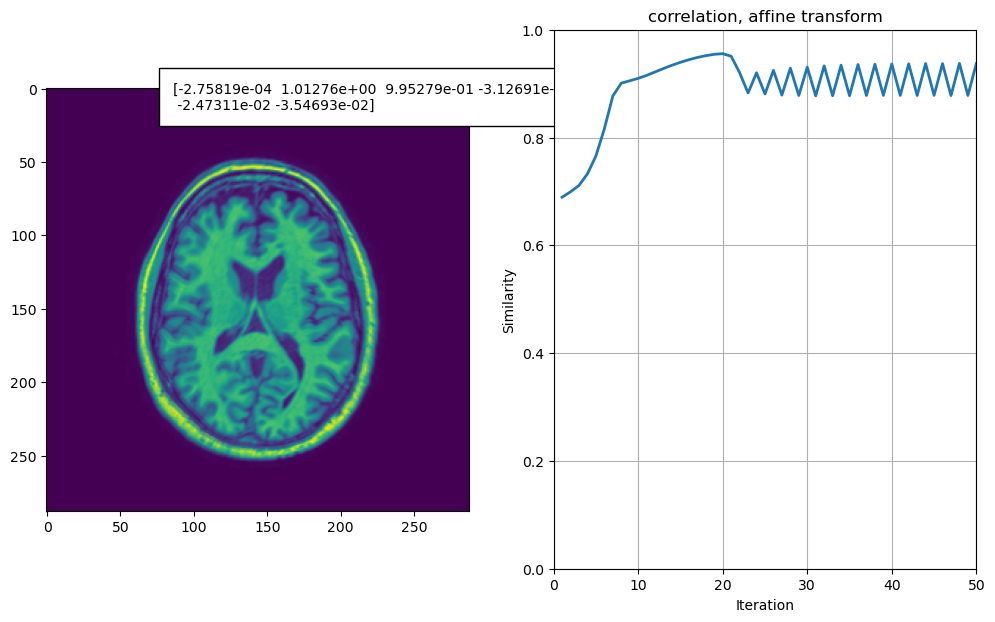

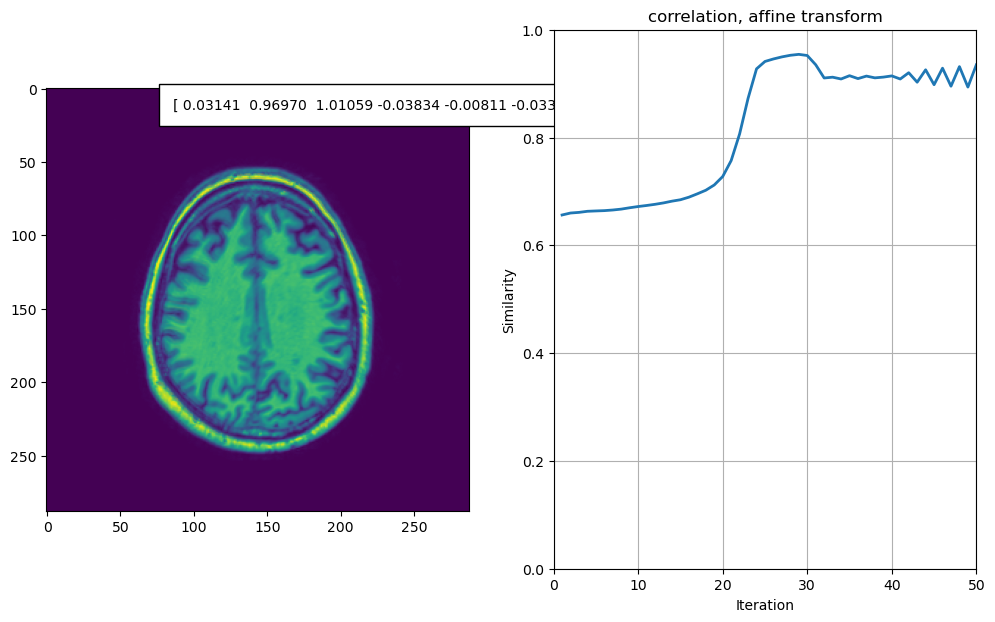

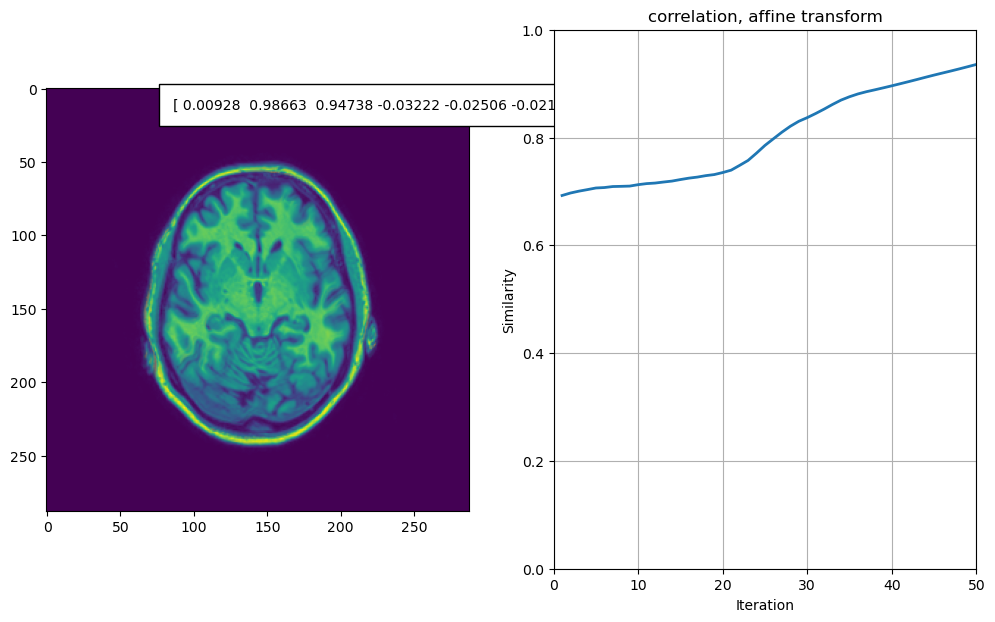

In [5]:
outputs_fixed_learning_rate_t1_t1_d = []
for image_t1, image_t1_d in zip(t1, t1_d):

    print('computing correlation for image:' + image_t1 + ' and ' + image_t1_d)
    I = plt.imread(image_t1)
    Im = plt.imread(image_t1_d)
    t1_t1_d_output_ncc = intensity_based_registration(I, Im, adaptive_learning = False, ncc = True, rigid = False)
    outputs_fixed_learning_rate_t1_t1_d.append(t1_t1_d_output_ncc)


### Correlation with fixed learning rate of t1 with t2 images (affine)

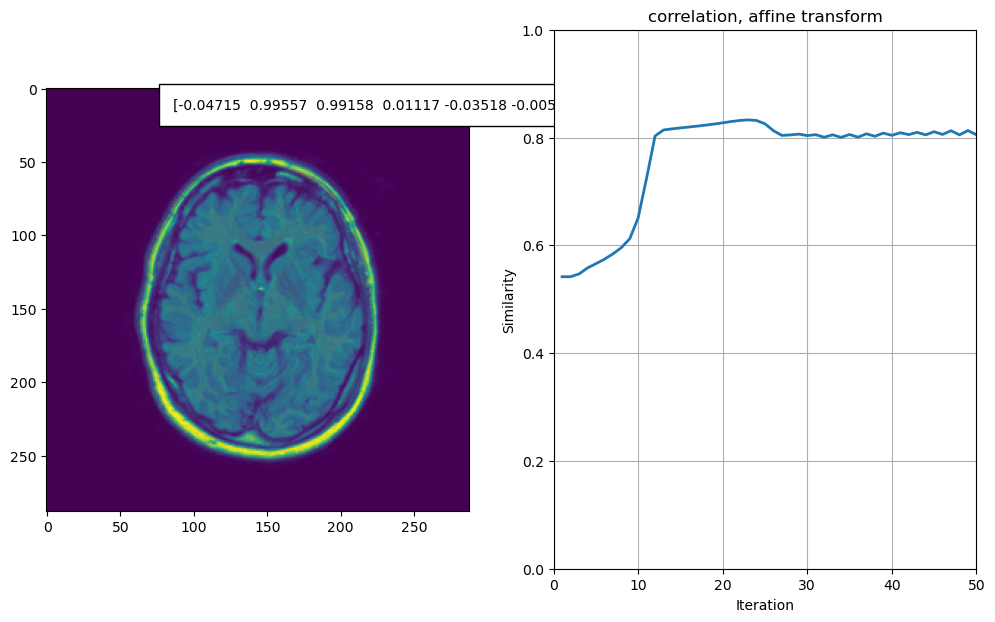

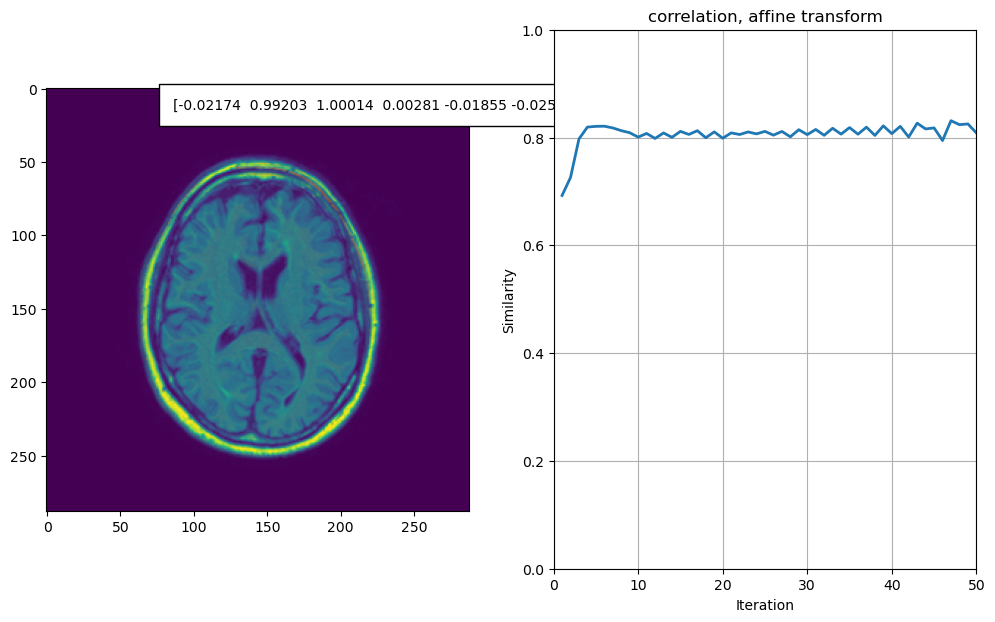

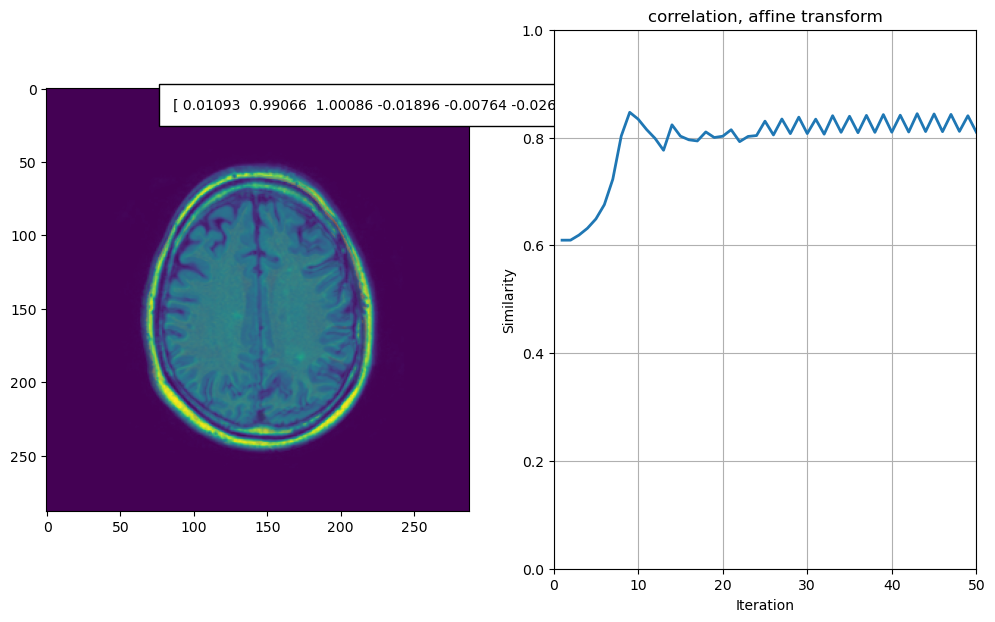

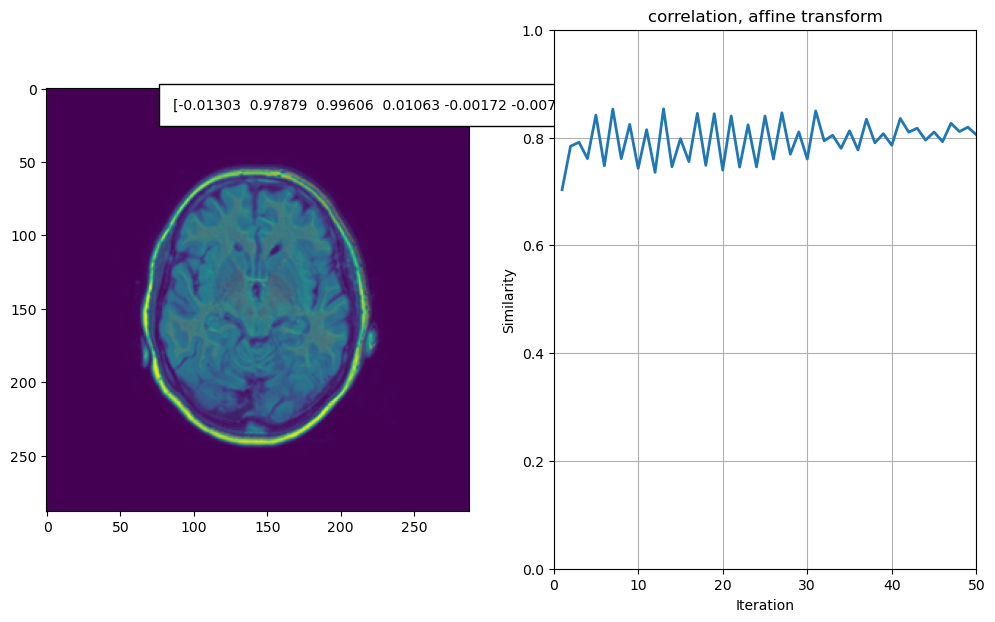

In [6]:
outputs_fixed_learning_rate_t1_t2 = []
for image_t1, image_t2 in zip(t1, t2):

    print('computing correlation for image:' + image_t1 + ' and ' + image_t2)
    I = plt.imread(image_t1)
    Im = plt.imread(image_t2)
    t1_t2_output_ncc = intensity_based_registration(I, Im, adaptive_learning = False, ncc = True, rigid = False)
    outputs_fixed_learning_rate_t1_t2.append(t1_t2_output_ncc)

### Correlation with adaptive learning rate of t1 and t1_d images (affine)

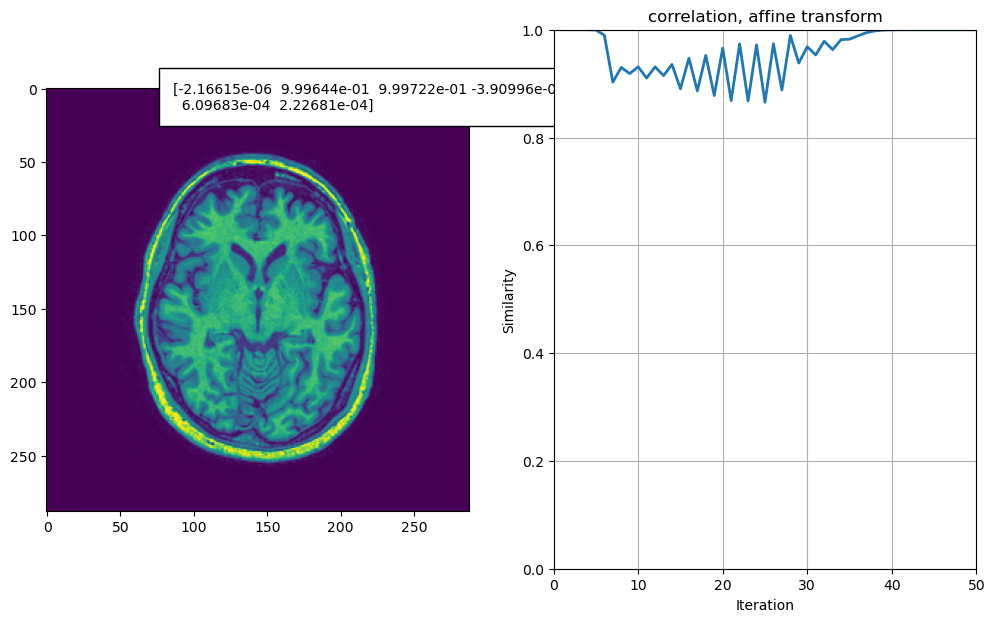

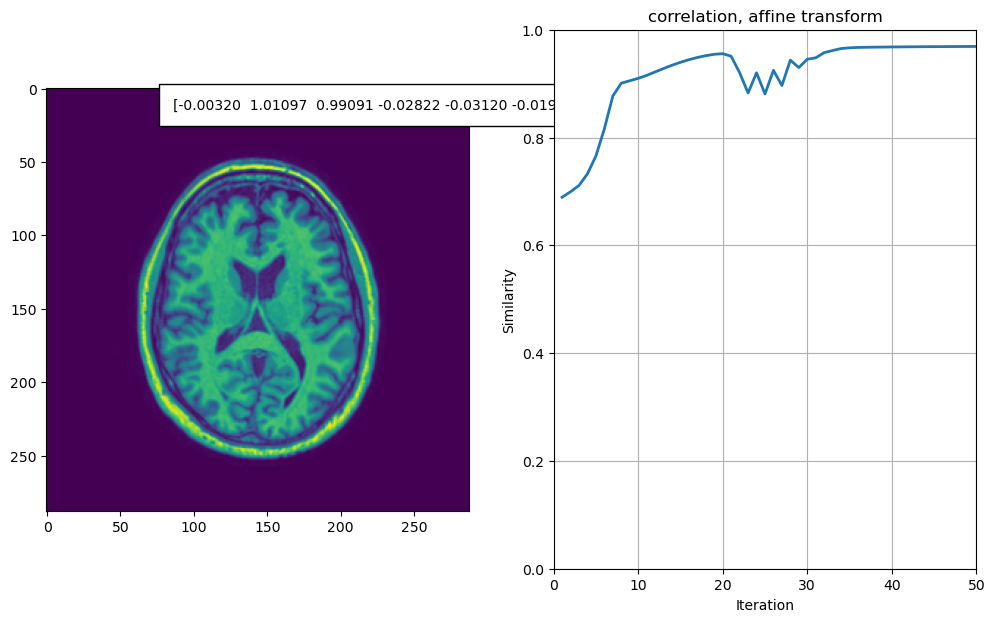

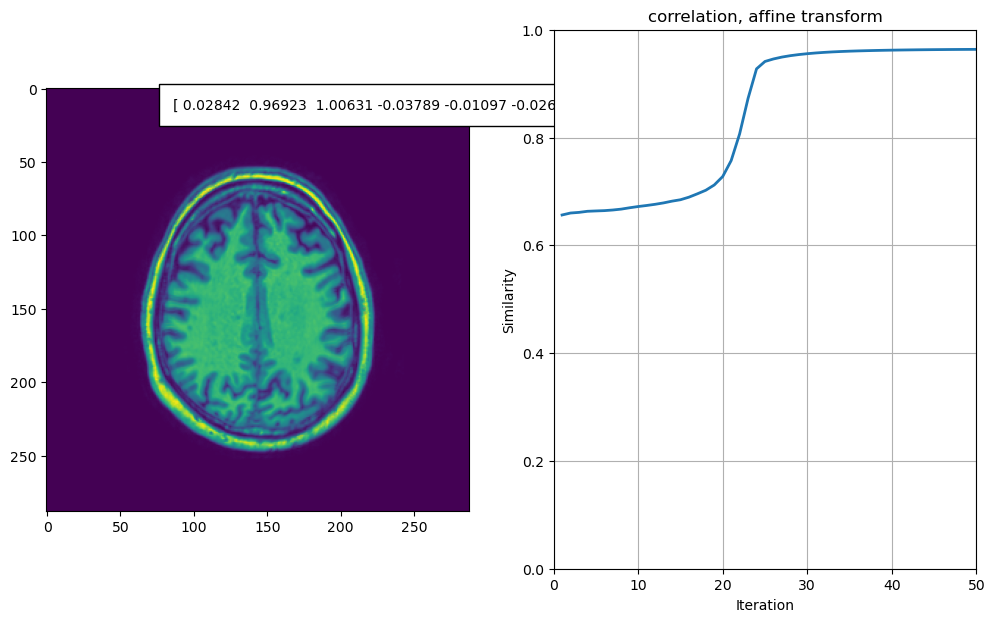

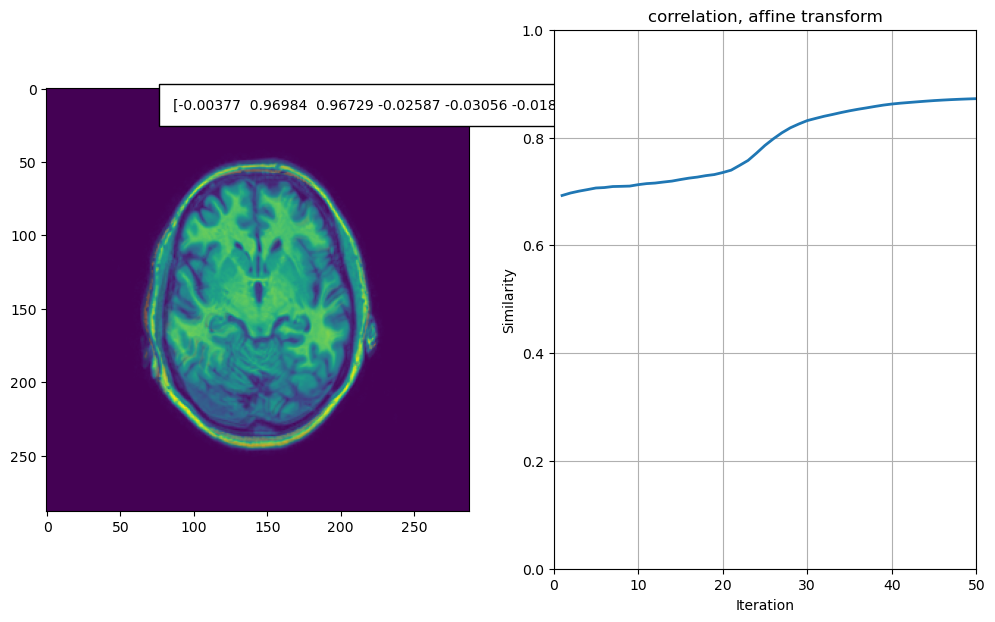

In [7]:
outputs_adaptive_learning_rate_t1_t1_d = []
for image_t1, image_t1_d in zip(t1, t1_d):

    print('computing correlation for image:' + image_t1 + ' and ' + image_t1_d)
    I = plt.imread(image_t1)
    Im = plt.imread(image_t1_d)
    t1_t1_d_output_ncc = intensity_based_registration(I, Im, adaptive_learning = True, ncc = True, rigid = False)
    outputs_adaptive_learning_rate_t1_t1_d.append(t1_t1_d_output_ncc)

### Correlation with adaptive learning rate of t1 and t2 images (affine)

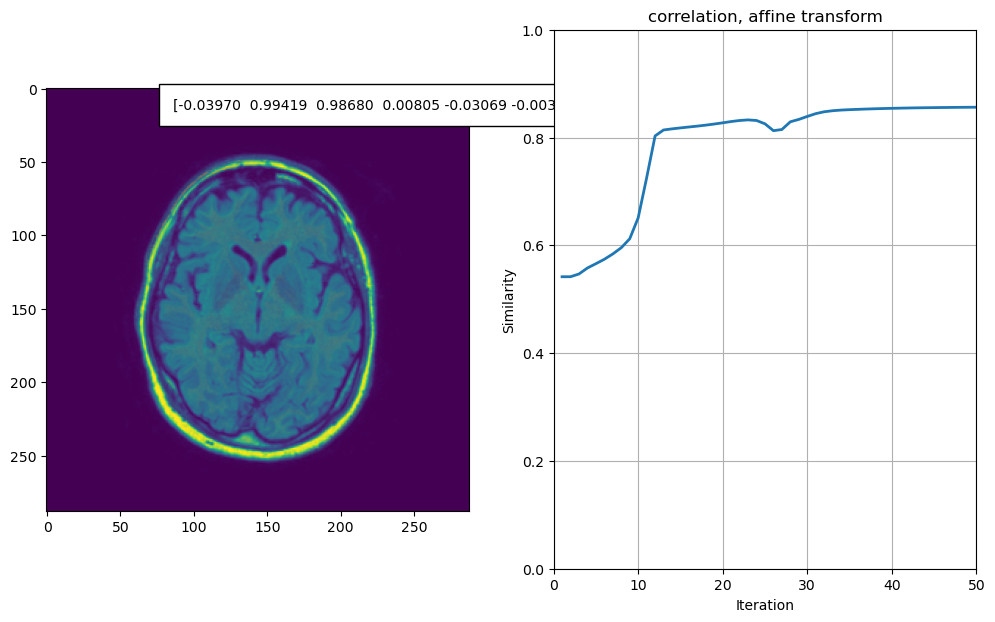

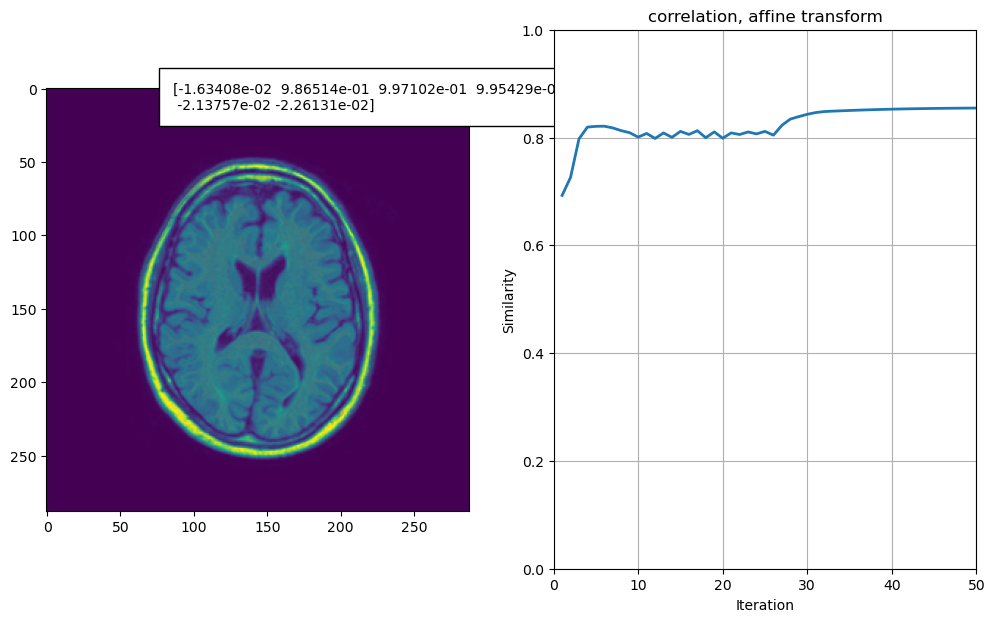

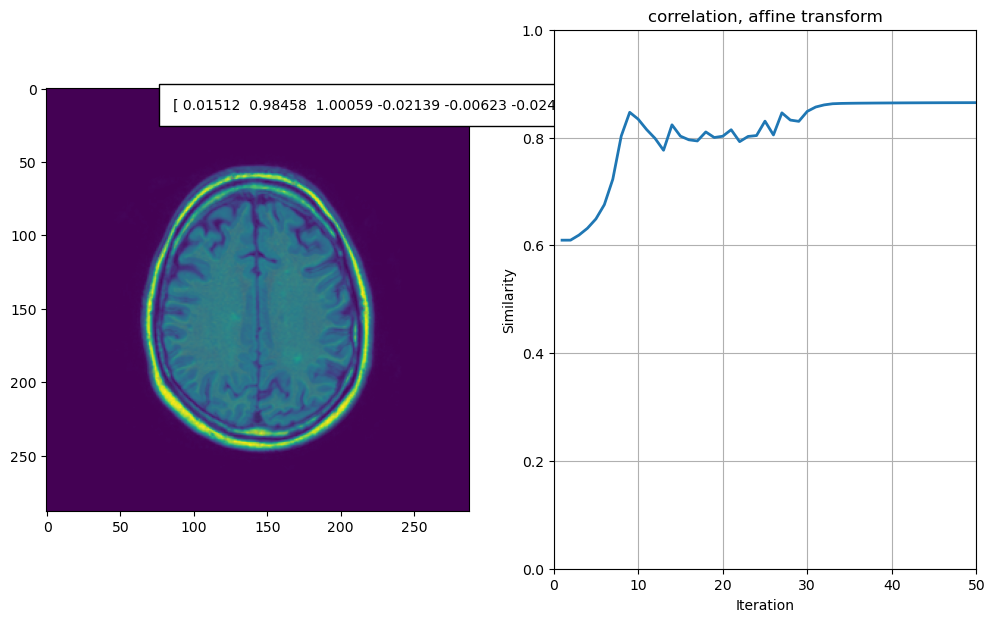

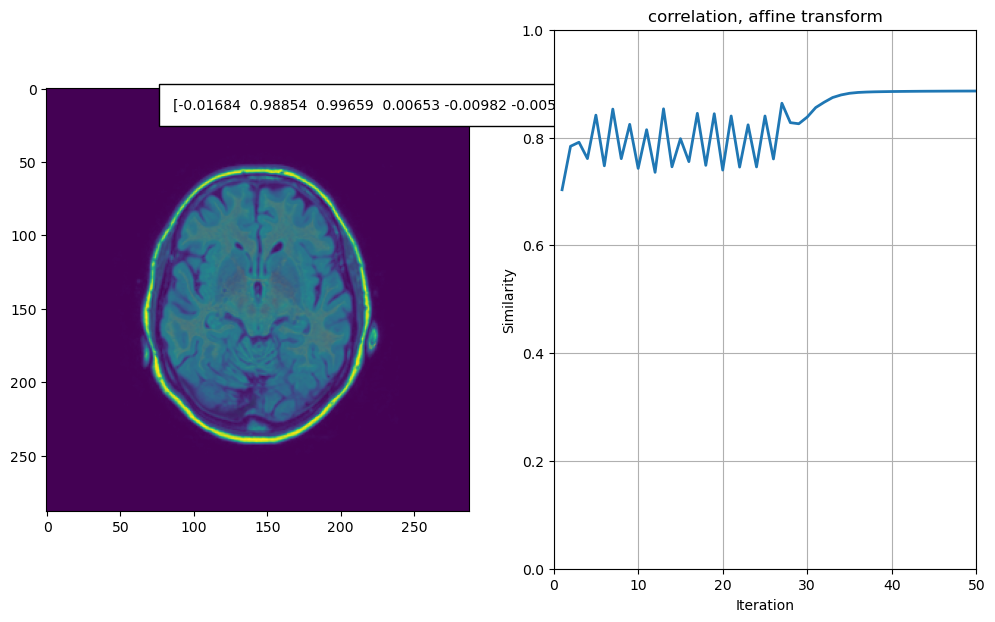

In [8]:
outputs_adaptive_learning_rate_t1_t2 = []
for image_t1, image_t2 in zip(t1, t2):

    print('computing correlation for image:' + image_t1 + ' and ' + image_t2)
    I = plt.imread(image_t1)
    Im = plt.imread(image_t2)
    t1_t2_output_ncc = intensity_based_registration(I, Im, adaptive_learning = True, ncc = True, rigid = False)
    outputs_adaptive_learning_rate_t1_t2.append(t1_t2_output_ncc)

### Get the last item in the similarity list

In [17]:

similarity_fixed_learning_rate_t1_t2 =  [arr[1] for arr in outputs_fixed_learning_rate_t1_t2]
similarity_adaptive_learning_rate_t1_t2 =  [arr[1] for arr in outputs_adaptive_learning_rate_t1_t2]
similarity_fixed_learning_rate_t1_t1_d =  [arr[1] for arr in outputs_fixed_learning_rate_t1_t1_d]
similarity_adaptive_learning_rate_t1_t1_d =  [arr[1] for arr in outputs_adaptive_learning_rate_t1_t1_d]


t_statistic_t2, p_value_t2 = stats.ttest_ind(similarity_fixed_learning_rate_t1_t2, similarity_adaptive_learning_rate_t1_t2)
t_statistic_t1, p_value_t1 = stats.ttest_ind(similarity_fixed_learning_rate_t1_t1_d, similarity_adaptive_learning_rate_t1_t1_d)

print(t_statistic_t1, p_value_t1)
print(t_statistic_t2, p_value_t2)




[[-0.21195598]] [[0.8391581]]
[[-7.90360616]] [[0.00021761]]
